<a href="https://colab.research.google.com/github/cggdonner/Government720/blob/main/G720_GAN.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Government720 Synthetic Data Generation Using GAN
This is to extrapolate the data from the previous notebook.

### CLIENT 1

In [108]:
# Import pandas
import pandas as pd

# Access Google Drive for Excel file
from google.colab import drive
drive.mount('/content/drive')

# IN CASE OF GENERATING GAN DATA FOR WHOLE SERIES
# Load the file from Google Drive
file_path = '/content/drive/My Drive/G720_CLIENT1_Noisy_Interpolated.xlsx'

# Load specified sheet
df = pd.read_excel(file_path, engine='openpyxl')

# Display the first few rows
print(df.head())

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
   UNEMPLOYMENT_RATE  INFLATION_RATE       GDP  HOUSING_AFFORD  MIN_WAGE  \
0                NaN        0.428571  0.000000             NaN  0.000000   
1                NaN        0.439460 -0.006451             NaN -0.015130   
2                NaN        0.461814  0.020851             NaN  0.002986   
3                NaN        0.466160  0.023599             NaN -0.012395   
4                NaN        0.473214 -0.014477             NaN -0.006515   

   POVERTY_WAGE  GENDER_GAP  RACIAL_GAP  DEFICIT  SS_RECIPIENTS  ...  \
0      0.000000    1.000000    0.000000      NaN       0.000000  ...   
1      0.012035    1.012380    0.015080      NaN      -0.012662  ...   
2     -0.003704    1.000877    0.012387      NaN      -0.001014  ...   
3     -0.024910    0.995282    0.023790      NaN      -0.011743  ...   
4      0.009105    1.000385    0.021138      NaN      

In [109]:
# Print how many missing values are still in the data
print(df.isnull().sum())

UNEMPLOYMENT_RATE        255
INFLATION_RATE             4
GDP                       51
HOUSING_AFFORD           415
MIN_WAGE                  51
POVERTY_WAGE             103
GENDER_GAP                51
RACIAL_GAP                51
DEFICIT                  155
SS_RECIPIENTS            155
CPI                        8
MEDIAN_WAGE              155
MANU_JOBS                181
UNION_MEMBERS            103
JOBS_ADDED                 0
POVERTY_RATE             207
FED_EMPLOY                 8
GAO_HIGH_RISK             51
INCOME_TAX               155
PAYROLL_TAX              155
CORPORATE_TAX            155
CORPORATE_PROFIT          77
TOP1_WEALTH              103
FICO_SCORE               389
UNEMPLOY_PER_JOB_OPEN    519
LABOR_PART_RATE          259
LAYOFF_RATE               59
CHILDCARE_COST             4
TEACHER_PAY              727
dtype: int64


In [110]:
# Data is already scaled so no need to transform
# Import packages
import numpy as np

# Convert to 3D format (samples, timesteps, features)
def create_sequences(data, window_size):
    sequences = []
    for i in range(len(data) - window_size):
        sequences.append(data[i:i + window_size])
    return np.array(sequences)

window_size = 260  # 5 years of observations
train_data = create_sequences(df, window_size)

In [111]:
# Import packages for model architecture
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, LSTM, Dropout

# Define the generator
def build_generator():
    model = Sequential([
        LSTM(100, return_sequences=True, activation='linear', input_shape=(1, noise_dim)),  # No built-in activation
        tf.keras.layers.LeakyReLU(alpha=0.2),  # Apply Leaky ReLU explicitly
        Dropout(0.2),

        LSTM(100, return_sequences=False, activation='linear'),  # No built-in activation
        tf.keras.layers.LeakyReLU(alpha=0.2),  # Apply Leaky ReLU explicitly

        Dense(df.shape[1] * window_size, activation='linear'),  # Keep final output linear
        tf.keras.layers.Reshape((window_size, df.shape[1]))  # Reshape to match expected shape
    ])
    return model

# Define the discriminator
def build_discriminator():
    model = Sequential([
        LSTM(100, return_sequences=True, activation='linear', input_shape=(window_size, df.shape[1])),
        tf.keras.layers.LeakyReLU(alpha=0.2),  # Apply Leaky ReLU explicitly
        Dropout(0.2),

        LSTM(50, return_sequences=False, activation='linear'),
        tf.keras.layers.LeakyReLU(alpha=0.2),  # Apply Leaky ReLU explicitly

        Dense(1, activation='linear')  # Output should remain linear
    ])
    return model

In [112]:
def add_trend_to_noise(batch_size, noise_dim):
    noise = np.random.normal(0, 0.1, (batch_size, noise_dim))  # Small noise (batch_size, noise_dim)
    trend = np.linspace(0, 1, batch_size).reshape(batch_size, 1)  # Linear trend (batch_size, 1)
    trend_noise = trend * noise  # Multiply trend with noise (batch_size, noise_dim)
    return trend_noise

In [113]:
# Training using tensorflow
import tensorflow as tf
from tensorflow.keras.optimizers import Adam

# Training Loop
epochs = 1000
batch_size = 32
noise_dim = 10  # Noise dimension for the generator

# Initialize generator & discriminator
generator = build_generator()
discriminator = build_discriminator()

# Compile discriminator with clipnorm to prevent spiking in gradients
discriminator.compile(
    loss='mean_squared_error',
    optimizer=Adam(learning_rate=1e-4, beta_1=0.5, clipnorm=0.5),  # Use clipnorm for gradient clipping
    metrics=['mean_absolute_error']
)

# GAN Model (stack generator & discriminator)
gan_input = tf.keras.Input(shape=(noise_dim,))
reshaped_input = tf.keras.layers.Reshape((1, noise_dim))(gan_input)  # Reshape to (None, 1, noise_dim)
generated_data = generator(reshaped_input)  # Pass reshaped input through the generator
discriminator.trainable = False  # Freeze discriminator during GAN training
validity = discriminator(generated_data)
gan = tf.keras.Model(gan_input, validity)
# Compile GAN with gradient clipping
gan.compile(
    loss='mean_squared_error',
    optimizer=Adam(learning_rate=1e-4, beta_1=0.5, clipnorm=0.5)  # Use clipnorm for gradient clipping
)

# Helper function to get a batch of real data
def real_samples(batch_size):
    indices = np.random.randint(0, train_data.shape[0], batch_size)
    return train_data[indices]

# Helper function to generate fake data
def generate_fake_samples(batch_size):
    noise = np.random.normal(0, 1, (batch_size, noise_dim))  # Random noise
    noise = noise.reshape(batch_size, 1, noise_dim)  # Reshape to (batch_size, 1, noise_dim)
    fake_data = generator.predict(noise)  # Generate fake data from noise
    return fake_data

# Real labels (1 for real data) and fake labels (0 for fake data)
real_labels = np.ones((batch_size, 1))
fake_labels = np.zeros((batch_size, 1))

# Training loop
for epoch in range(epochs):
    # Train Discriminator
    real_data = real_samples(batch_size)  # Get real data
    fake_data = generate_fake_samples(batch_size)  # Get fake data generated by the GAN

    # Train the discriminator
    real_loss = discriminator.train_on_batch(real_data, real_labels)
    fake_loss = discriminator.train_on_batch(fake_data, fake_labels)

    # Extract the loss values from the tuples
    real_loss_value = real_loss[0]  # The first element is the loss
    fake_loss_value = fake_loss[0]  # The first element is the loss

    # Compute the discriminator loss as the average of real and fake losses
    d_loss = 0.5 * (real_loss_value + fake_loss_value)

    # Train Generator
    #noise = np.random.normal(0, 0.01, (batch_size, noise_dim))  # Random noise for generator input
    noise = add_trend_to_noise(batch_size, noise_dim)
    g_loss = gan.train_on_batch(noise, real_labels)  # Generator tries to fool the discriminator

    # Print progress
    if epoch % 100 == 0:
        print(f"Epoch {epoch}: D Loss: {d_loss} | G Loss: {g_loss}")

/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
/usr/local/lib/python3.11/dist-packages/keras/src/layers/activations/leaky_relu.py:41: UserWarning: Argument `alpha` is deprecated. Use `negative_slope` instead.
  warnings.warn(


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 357ms/step


/usr/local/lib/python3.11/dist-packages/keras/src/backend/tensorflow/trainer.py:82: UserWarning: The model does not have any trainable weights.
  warnings.warn("The model does not have any trainable weights.")


Epoch 0: D Loss: nan | G Loss: 0.9999967813491821
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step


In [114]:
from scipy.ndimage import gaussian_filter
import numpy as np

# Generate new time-series sequences (using your GAN)
noise = np.random.normal(0, 0.01, (batch_size, 1, noise_dim))  # Correct shape
synthetic_data = generator.predict(noise)

# Apply Gaussian smoothing to the entire generated data
sigma = 1 # Standard deviation for the Gaussian filter (adjust this value as needed)
synthetic_data_smoothed = gaussian_filter(synthetic_data, sigma=(0, sigma, 0))  # Smooth over the time axis (axis 1)

# Now, let's fill in the missing values in the original dataframe using the smoothed synthetic data

# Create a copy of the original dataframe to avoid modifying it directly
df_filled = df.copy()

for j in range(df.shape[1]):
    # Extract known values for feature j
    real_values = df.iloc[:, j].dropna().values

    if len(real_values) > 0:
        last_known = real_values[-1]  # Last observed value before missing data
        mean_synthetic = np.mean(synthetic_data_smoothed[:, -1, j])
        std_synthetic = np.std(synthetic_data_smoothed[:, -1, j])

        # Rescale smoothed synthetic data to match the real trend
        synthetic_data_smoothed[:, -1, j] = (synthetic_data_smoothed[:, -1, j] - mean_synthetic) / std_synthetic * np.std(real_values) + last_known

# Fill missing values with adjusted smoothed synthetic data
for i in range(len(df_filled)):
    for j in range(df.shape[1]):
        if np.isnan(df_filled.iloc[i, j]):
            # Ensure we're using the correct batch index (i in range 0 to batch_size-1)
            batch_index = i % synthetic_data_smoothed.shape[0]  # Wrap around if necessary
            df_filled.iloc[i, j] = synthetic_data_smoothed[batch_index, -1, j]  # Use last timestep

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


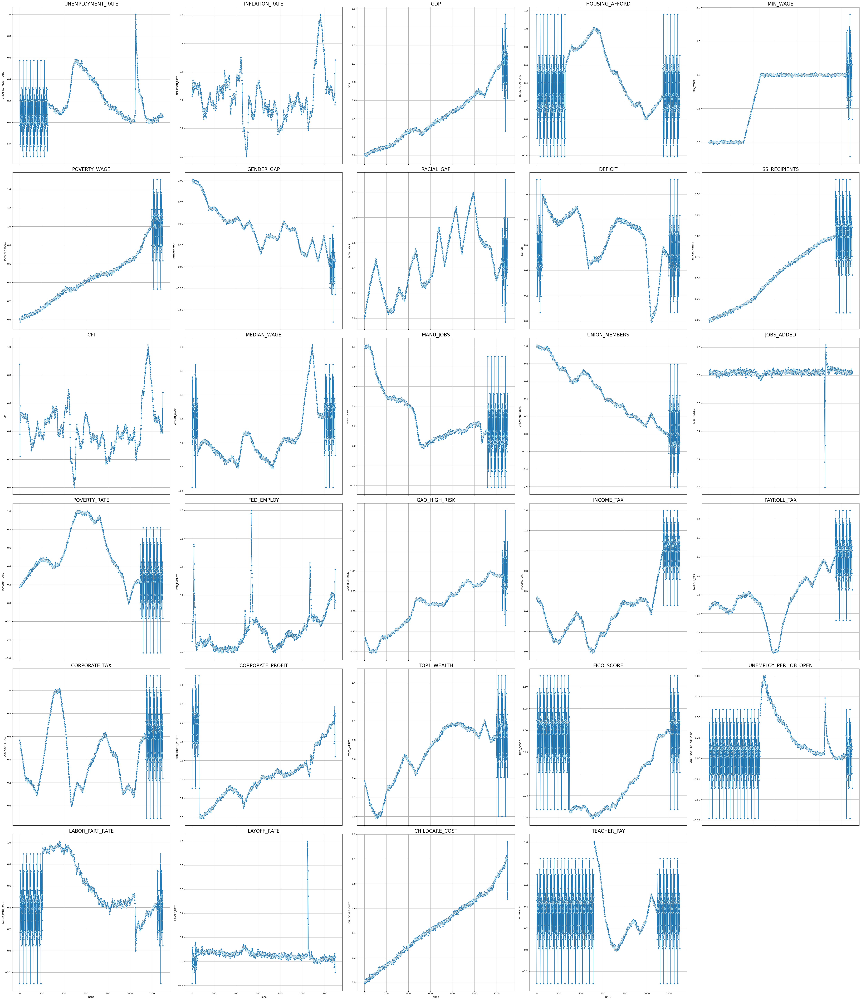

In [115]:
# Make multi-graph chart of numeric time series variables to verify GAN data generation is good
# Import packages
import seaborn as sns
import matplotlib.pyplot as plt

# Plot each variable in a mini-plot
fig, axes = plt.subplots(nrows=6, ncols=5, figsize=(50, 2*len(df_filled.columns)), sharex=True)

# Flatten the axes array for easy indexing
axes = axes.flatten()

for i, col in enumerate(df_filled.columns):
    sns.lineplot(data=df_filled, x=df_filled.index, y=col, ax=axes[i], marker='o')
    axes[i].set_title(f"{col}", fontsize=20)
    axes[i].set_ylabel(col)
    axes[i].grid(True)

# Hide any unused subplots (if num_vars is not a multiple of 5)
for i in range(len(df_filled.columns), len(axes)):
    fig.delaxes(axes[i])

plt.xlabel("DATE")
plt.tight_layout()
plt.show()

In [35]:
# Verify that there are no missing values
df_filled.isna().values.any()

False

In [36]:
# Define the output file path
output_file = "/content/drive/My Drive/G720_CLIENT1_GAN.xlsx"

# Save DataFrame to Excel
df_filled.to_excel(output_file, index=False, engine='openpyxl')

print(f"Data successfully saved to {output_file}")

Data successfully saved to /content/drive/My Drive/G720_CLIENT1_GAN.xlsx


### CLIENT 2

In [37]:
# Load the file from Google Drive
file_path = '/content/drive/My Drive/G720_CLIENT2_Noisy_Interpolated.xlsx'

# Load specified sheet
df = pd.read_excel(file_path, engine='openpyxl')

# Display the first few rows
print(df.head())

   MEDIA_TRUST  FACEBOOK_USE  INSTAGRAM_USE  TWITTER_USE  FACT_CHECKERS  \
0    55.000000      0.000000            0.0     0.000000            NaN   
1    54.865717      0.108169            0.0     0.031225            NaN   
2    54.732159      0.216330            0.0     0.062399            NaN   
3    54.599418      0.324482            0.0     0.093523            NaN   
4    54.467586      0.432625            0.0     0.124597            NaN   

   MISINFORMATION_MENTIONS  
0                      NaN  
1                      NaN  
2                      NaN  
3                      NaN  
4                      NaN  


In [38]:
# Print how many missing values are still in the data
print(df.isnull().sum())

MEDIA_TRUST                  0
FACEBOOK_USE               103
INSTAGRAM_USE              103
TWITTER_USE                103
FACT_CHECKERS              883
MISINFORMATION_MENTIONS    792
dtype: int64


In [39]:
# Normalize data for GAN training using StandardScaler
scaler = StandardScaler()
data_scaled = scaler.fit_transform(df)

# Convert to 3D format (samples, timesteps, features)
def create_sequences(data, window_size):
    sequences = []
    for i in range(len(data) - window_size):
        sequences.append(data[i:i + window_size])
    return np.array(sequences)

window_size = 260  # 5 years of observations
train_data = create_sequences(data_scaled, window_size)

In [40]:
# Define the generator
def build_generator():
    model = Sequential([
        LSTM(100, return_sequences=True, activation='linear', input_shape=(1, noise_dim)),  # No built-in activation
        tf.keras.layers.LeakyReLU(alpha=0.2),  # Apply Leaky ReLU explicitly
        Dropout(0.2),

        LSTM(100, return_sequences=False, activation='linear'),  # No built-in activation
        tf.keras.layers.LeakyReLU(alpha=0.2),  # Apply Leaky ReLU explicitly

        Dense(df.shape[1] * window_size, activation='linear'),  # Keep final output linear
        tf.keras.layers.Reshape((window_size, df.shape[1]))  # Reshape to match expected shape
    ])
    return model

# Define the discriminator
def build_discriminator():
    model = Sequential([
        LSTM(100, return_sequences=True, activation='linear', input_shape=(window_size, df.shape[1])),
        tf.keras.layers.LeakyReLU(alpha=0.2),  # Apply Leaky ReLU explicitly
        Dropout(0.2),

        LSTM(50, return_sequences=False, activation='linear'),
        tf.keras.layers.LeakyReLU(alpha=0.2),  # Apply Leaky ReLU explicitly

        Dense(1, activation='linear')  # Output should remain linear
    ])
    return model

In [41]:
# Training Loop
epochs = 500
batch_size = 32
noise_dim = 50  # Noise dimension for the generator

# Initialize generator & discriminator
generator = build_generator()
discriminator = build_discriminator()

# Compile discriminator with clipnorm to prevent spiking in gradients
discriminator.compile(
    loss='mean_squared_error',
    optimizer=Adam(learning_rate=1e-4, beta_1=0.5, clipnorm=0.2),  # Use clipnorm for gradient clipping
    metrics=['mean_absolute_error']
)

# GAN Model (stack generator & discriminator)
gan_input = tf.keras.Input(shape=(noise_dim,))
reshaped_input = tf.keras.layers.Reshape((1, noise_dim))(gan_input)  # Reshape to (None, 1, noise_dim)
generated_data = generator(reshaped_input)  # Pass reshaped input through the generator
discriminator.trainable = False  # Freeze discriminator during GAN training
validity = discriminator(generated_data)
gan = tf.keras.Model(gan_input, validity)
# Compile GAN with gradient clipping
gan.compile(
    loss='mean_squared_error',
    optimizer=Adam(learning_rate=1e-4, beta_1=0.5, clipnorm=0.2)  # Use clipnorm for gradient clipping
)

# Helper function to get a batch of real data
def real_samples(batch_size):
    indices = np.random.randint(0, train_data.shape[0], batch_size)
    return train_data[indices]

# Helper function to generate fake data
def generate_fake_samples(batch_size):
    noise = np.random.normal(0, 1, (batch_size, noise_dim))  # Random noise
    noise = noise.reshape(batch_size, 1, noise_dim)  # Reshape to (batch_size, 1, noise_dim)
    fake_data = generator.predict(noise)  # Generate fake data from noise
    return fake_data

# Real labels (1 for real data) and fake labels (0 for fake data)
real_labels = np.ones((batch_size, 1))
fake_labels = np.zeros((batch_size, 1))

# Training loop
for epoch in range(epochs):
    # Train Discriminator
    real_data = real_samples(batch_size)  # Get real data
    fake_data = generate_fake_samples(batch_size)  # Get fake data generated by the GAN

    # Train the discriminator
    real_loss = discriminator.train_on_batch(real_data, real_labels)
    fake_loss = discriminator.train_on_batch(fake_data, fake_labels)

    # Extract the loss values from the tuples
    real_loss_value = real_loss[0]  # The first element is the loss
    fake_loss_value = fake_loss[0]  # The first element is the loss

    # Compute the discriminator loss as the average of real and fake losses
    d_loss = 0.5 * (real_loss_value + fake_loss_value)

    # Train Generator
    noise = np.random.normal(0, 1, (batch_size, noise_dim))  # Random noise for generator input
    g_loss = gan.train_on_batch(noise, real_labels)  # Generator tries to fool the discriminator

    # Print progress
    if epoch % 100 == 0:
        print(f"Epoch {epoch}: D Loss: {d_loss} | G Loss: {g_loss}")

/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
/usr/local/lib/python3.11/dist-packages/keras/src/layers/activations/leaky_relu.py:41: UserWarning: Argument `alpha` is deprecated. Use `negative_slope` instead.
  warnings.warn(


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 341ms/step


/usr/local/lib/python3.11/dist-packages/keras/src/backend/tensorflow/trainer.py:82: UserWarning: The model does not have any trainable weights.
  warnings.warn("The model does not have any trainable weights.")


Epoch 0: D Loss: nan | G Loss: 0.9998428225517273
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step


In [42]:
# Generate new time-series sequences
noise = np.random.normal(0, 1, (df.shape[0], 1, noise_dim))  # Reshape to (batch_size, 1, noise_dim)
synthetic_data = generator.predict(noise)

# Apply Gaussian smoothing to the generated data
sigma = 1  # Standard deviation for the Gaussian filter (adjust based on smoothing strength)
synthetic_data_smoothed = gaussian_filter(synthetic_data, sigma=sigma)

# Rescale back to original values
synthetic_data_rescaled = scaler.inverse_transform(synthetic_data_smoothed.reshape(-1, df.shape[1]))

# Replace missing values in original dataset
df_filled = df.copy()

# Fill in missing data
for i in range(len(df_filled)):
    for j in range(df.shape[1]):  # Loop over features
        if np.isnan(df_filled.iloc[i, j]):
            df_filled.iloc[i, j] = synthetic_data_rescaled[i, j]

41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step


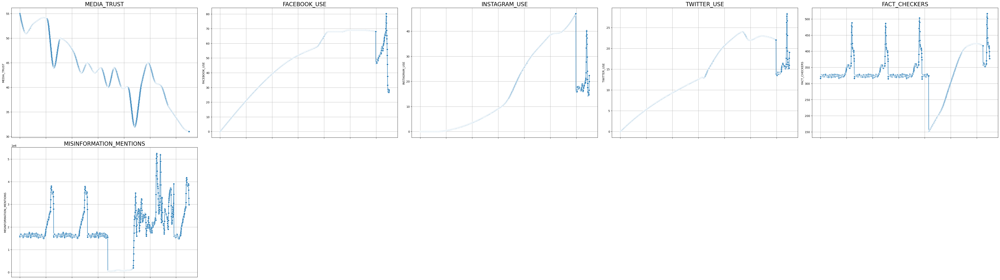

In [43]:
# Plot each variable in a mini-plot
fig, axes = plt.subplots(nrows=6, ncols=5, figsize=(50, 7*len(df_filled.columns)), sharex=True)

# Flatten the axes array for easy indexing
axes = axes.flatten()

for i, col in enumerate(df_filled.columns):
    sns.lineplot(data=df_filled, x=df_filled.index, y=col, ax=axes[i], marker='o')
    axes[i].set_title(f"{col}", fontsize=20)
    axes[i].set_ylabel(col)
    axes[i].grid(True)

# Hide any unused subplots (if num_vars is not a multiple of 5)
for i in range(len(df_filled.columns), len(axes)):
    fig.delaxes(axes[i])

plt.xlabel("DATE")
plt.tight_layout()
plt.show()

In [44]:
# Verify that there are no missing values
df_filled.isna().values.any()

False

In [45]:
# Define the output file path
output_file = "/content/drive/My Drive/G720_CLIENT2_GAN.xlsx"

# Save DataFrame to Excel
df_filled.to_excel(output_file, index=False, engine='openpyxl')

print(f"Data successfully saved to {output_file}")

Data successfully saved to /content/drive/My Drive/G720_CLIENT2_GAN.xlsx


### CLIENT 3

In [53]:
# Load the file from Google Drive
file_path = '/content/drive/My Drive/G720_CLIENT3_Noisy_Interpolated.xlsx'

# Load specified sheet
df = pd.read_excel(file_path, engine='openpyxl')

# Display the first few rows
print(df.head())

   GUN_DEATH_RATE  OVERDOSE_DEATH_RATE  HEALTH_INSURANCE    SUICIDE  \
0       10.300000             6.100000         86.900000  10.400000   
1       10.296179             6.097229         86.892308  10.406703   
2       10.292408             6.094683         86.884615  10.413352   
3       10.288690             6.092359         86.876923  10.419947   
4       10.285025             6.090256         86.869231  10.426491   

   OBESITY_RATE  ABORTIONS  MENTAL_ILLNESS_RATE  OPIOID_DEATHS  \
0           NaN        NaN                  NaN    8407.000000   
1           NaN        NaN                  NaN    8415.358725   
2           NaN        NaN                  NaN    8424.222883   
3           NaN        NaN                  NaN    8433.591756   
4           NaN        NaN                  NaN    8443.464627   

   OPIOID_PRESCRIP  FENTANYL_DEATHS  ALCOHOL_TREATMENT  OPIOID_TREATMENT  \
0              NaN       782.000000                NaN               NaN   
1              NaN      

In [55]:
# Print how many missing values are still in the data
print(df.isnull().sum())

GUN_DEATH_RATE           0
OVERDOSE_DEATH_RATE      0
HEALTH_INSURANCE       104
SUICIDE                104
OBESITY_RATE           312
ABORTIONS              780
MENTAL_ILLNESS_RATE    572
OPIOID_DEATHS            0
OPIOID_PRESCRIP        416
FENTANYL_DEATHS          0
ALCOHOL_TREATMENT      416
OPIOID_TREATMENT       416
IVF_BABIES             780
VACC_IMPORTANCE         52
DIABETES_RATE          364
CANCER_SURVIVAL        416
CANCER_INCIDENCE       156
CANCER_MORTALITY         0
HEART_DISEASE          260
FDA_APPROVALS          104
dtype: int64


In [56]:
# Normalize data for GAN training using StandardScaler
scaler = StandardScaler()
data_scaled = scaler.fit_transform(df)

# Convert to 3D format (samples, timesteps, features)
def create_sequences(data, window_size):
    sequences = []
    for i in range(len(data) - window_size):
        sequences.append(data[i:i + window_size])
    return np.array(sequences)

window_size = 260  # 5 years of observations
train_data = create_sequences(data_scaled, window_size)

In [57]:
# Define the generator
def build_generator():
    model = Sequential([
        LSTM(100, return_sequences=True, activation='linear', input_shape=(1, noise_dim)),  # No built-in activation
        tf.keras.layers.LeakyReLU(alpha=0.2),  # Apply Leaky ReLU explicitly
        Dropout(0.2),

        LSTM(100, return_sequences=False, activation='linear'),  # No built-in activation
        tf.keras.layers.LeakyReLU(alpha=0.2),  # Apply Leaky ReLU explicitly

        Dense(df.shape[1] * window_size, activation='linear'),  # Keep final output linear
        tf.keras.layers.Reshape((window_size, df.shape[1]))  # Reshape to match expected shape
    ])
    return model

# Define the discriminator
def build_discriminator():
    model = Sequential([
        LSTM(100, return_sequences=True, activation='linear', input_shape=(window_size, df.shape[1])),
        tf.keras.layers.LeakyReLU(alpha=0.2),  # Apply Leaky ReLU explicitly
        Dropout(0.2),

        LSTM(50, return_sequences=False, activation='linear'),
        tf.keras.layers.LeakyReLU(alpha=0.2),  # Apply Leaky ReLU explicitly

        Dense(1, activation='linear')  # Output should remain linear
    ])
    return model

In [58]:
# Training Loop
epochs = 500
batch_size = 32
noise_dim = 50  # Noise dimension for the generator

# Initialize generator & discriminator
generator = build_generator()
discriminator = build_discriminator()

# Compile discriminator with clipnorm to prevent spiking in gradients
discriminator.compile(
    loss='mean_squared_error',
    optimizer=Adam(learning_rate=1e-4, beta_1=0.5, clipnorm=0.2),  # Use clipnorm for gradient clipping
    metrics=['mean_absolute_error']
)

# GAN Model (stack generator & discriminator)
gan_input = tf.keras.Input(shape=(noise_dim,))
reshaped_input = tf.keras.layers.Reshape((1, noise_dim))(gan_input)  # Reshape to (None, 1, noise_dim)
generated_data = generator(reshaped_input)  # Pass reshaped input through the generator
discriminator.trainable = False  # Freeze discriminator during GAN training
validity = discriminator(generated_data)
gan = tf.keras.Model(gan_input, validity)
# Compile GAN with gradient clipping
gan.compile(
    loss='mean_squared_error',
    optimizer=Adam(learning_rate=1e-4, beta_1=0.5, clipnorm=0.2)  # Use clipnorm for gradient clipping
)

# Helper function to get a batch of real data
def real_samples(batch_size):
    indices = np.random.randint(0, train_data.shape[0], batch_size)
    return train_data[indices]

# Helper function to generate fake data
def generate_fake_samples(batch_size):
    noise = np.random.normal(0, 1, (batch_size, noise_dim))  # Random noise
    noise = noise.reshape(batch_size, 1, noise_dim)  # Reshape to (batch_size, 1, noise_dim)
    fake_data = generator.predict(noise)  # Generate fake data from noise
    return fake_data

# Real labels (1 for real data) and fake labels (0 for fake data)
real_labels = np.ones((batch_size, 1))
fake_labels = np.zeros((batch_size, 1))

# Training loop
for epoch in range(epochs):
    # Train Discriminator
    real_data = real_samples(batch_size)  # Get real data
    fake_data = generate_fake_samples(batch_size)  # Get fake data generated by the GAN

    # Train the discriminator
    real_loss = discriminator.train_on_batch(real_data, real_labels)
    fake_loss = discriminator.train_on_batch(fake_data, fake_labels)

    # Extract the loss values from the tuples
    real_loss_value = real_loss[0]  # The first element is the loss
    fake_loss_value = fake_loss[0]  # The first element is the loss

    # Compute the discriminator loss as the average of real and fake losses
    d_loss = 0.5 * (real_loss_value + fake_loss_value)

    # Train Generator
    noise = np.random.normal(0, 1, (batch_size, noise_dim))  # Random noise for generator input
    g_loss = gan.train_on_batch(noise, real_labels)  # Generator tries to fool the discriminator

    # Print progress
    if epoch % 100 == 0:
        print(f"Epoch {epoch}: D Loss: {d_loss} | G Loss: {g_loss}")

/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
/usr/local/lib/python3.11/dist-packages/keras/src/layers/activations/leaky_relu.py:41: UserWarning: Argument `alpha` is deprecated. Use `negative_slope` instead.
  warnings.warn(


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 347ms/step


/usr/local/lib/python3.11/dist-packages/keras/src/backend/tensorflow/trainer.py:82: UserWarning: The model does not have any trainable weights.
  warnings.warn("The model does not have any trainable weights.")


Epoch 0: D Loss: nan | G Loss: 0.9998378753662109
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 59ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 165ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step

In [59]:
# Generate new time-series sequences
noise = np.random.normal(0, 1, (df.shape[0], 1, noise_dim))
synthetic_data = generator.predict(noise)

# Apply Gaussian smoothing to the generated data
sigma = 1  # Standard deviation for the Gaussian filter (adjust based on smoothing strength)
synthetic_data_smoothed = gaussian_filter(synthetic_data, sigma=sigma)

# Rescale back to original values
synthetic_data_rescaled = scaler.inverse_transform(synthetic_data_smoothed.reshape(-1, df.shape[1]))

# Replace missing values in original dataset
df_filled = df.copy()

# Fill in missing data
for i in range(len(df_filled)):
    for j in range(df.shape[1]):  # Loop over features
        if np.isnan(df_filled.iloc[i, j]):
            df_filled.iloc[i, j] = synthetic_data_rescaled[i, j]

40/40 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step


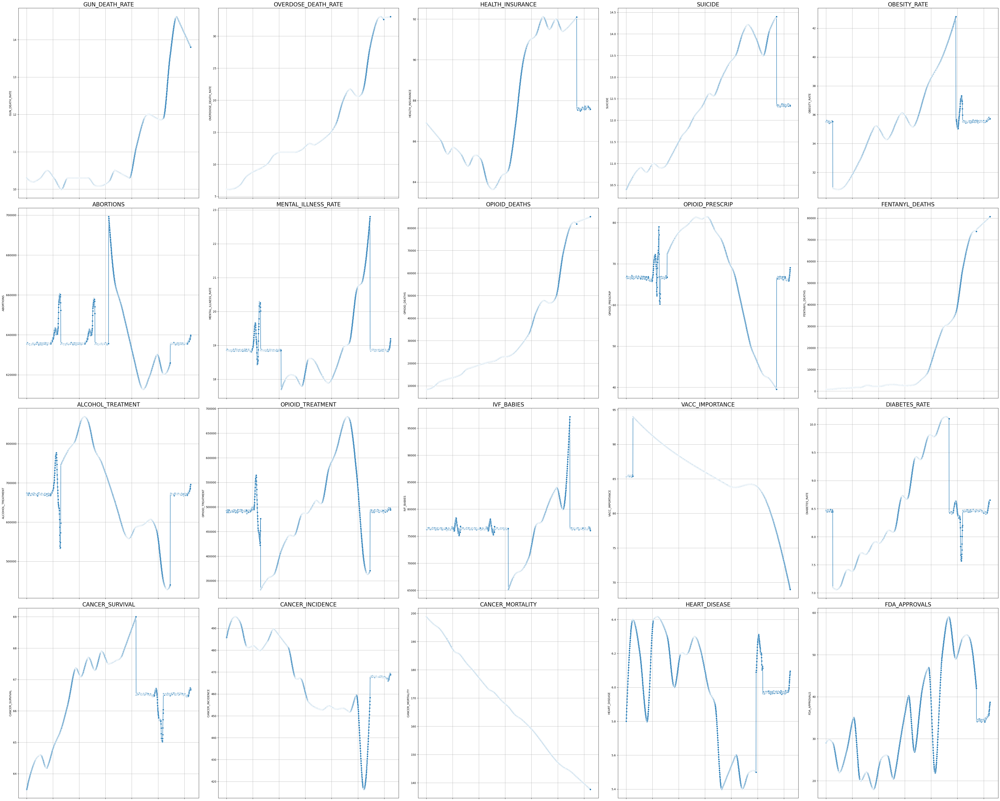

In [60]:
# Plot each variable in a mini-plot
fig, axes = plt.subplots(nrows=6, ncols=5, figsize=(50, 3*len(df_filled.columns)), sharex=True)

# Flatten the axes array for easy indexing
axes = axes.flatten()

for i, col in enumerate(df_filled.columns):
    sns.lineplot(data=df_filled, x=df_filled.index, y=col, ax=axes[i], marker='o')
    axes[i].set_title(f"{col}", fontsize=20)
    axes[i].set_ylabel(col)
    axes[i].grid(True)

# Hide any unused subplots (if num_vars is not a multiple of 5)
for i in range(len(df_filled.columns), len(axes)):
    fig.delaxes(axes[i])

plt.xlabel("DATE")
plt.tight_layout()
plt.show()

In [61]:
# Verify that there are no missing values
df_filled.isna().values.any()

False

In [62]:
# Define the output file path
output_file = "/content/drive/My Drive/G720_CLIENT3_GAN.xlsx"

# Save DataFrame to Excel
df_filled.to_excel(output_file, index=False, engine='openpyxl')

print(f"Data successfully saved to {output_file}")

Data successfully saved to /content/drive/My Drive/G720_CLIENT3_GAN.xlsx


### CLIENT 4

In [86]:
# Load the file from Google Drive
file_path = '/content/drive/My Drive/G720_CLIENT4_Noisy_Interpolated.xlsx'

# Load specified sheet
df = pd.read_excel(file_path, engine='openpyxl')

# Display the first few rows
print(df.head())

   DARK_MONEY  VOTER_TURNOUT  SUPREME_COURT_APPROVAL  CLOTURE_MOTIONS  \
0   11.210000      53.000000                     NaN              NaN   
1   11.098395      52.425536                     NaN              NaN   
2   10.987052      51.856147                     NaN              NaN   
3   10.875989      51.292064                     NaN              NaN   
4   10.765222      50.733521                     NaN              NaN   

   ENACTED_LEGIS  OFFICIAL_THREATS  PARTISAN_GAP_HOUSE  PARTISAN_GAP_SENATE  \
0            NaN               NaN                 NaN                  NaN   
1            NaN               NaN                 NaN                  NaN   
2            NaN               NaN                 NaN                  NaN   
3            NaN               NaN                 NaN                  NaN   
4            NaN               NaN                 NaN                  NaN   

   HOUSE_LEANING  SENATE_LEANING  
0            NaN             NaN  
1            NaN

In [88]:
# Print how many missing values are still in the data
print(df.isnull().sum())

DARK_MONEY                 51
VOTER_TURNOUT             155
SUPREME_COURT_APPROVAL     47
CLOTURE_MOTIONS            52
ENACTED_LEGIS              52
OFFICIAL_THREATS          831
PARTISAN_GAP_HOUSE        259
PARTISAN_GAP_SENATE         0
HOUSE_LEANING             155
SENATE_LEANING            155
dtype: int64


In [89]:
# Normalize data for GAN training using StandardScaler
scaler = StandardScaler()
data_scaled = scaler.fit_transform(df)

# Convert to 3D format (samples, timesteps, features)
def create_sequences(data, window_size):
    sequences = []
    for i in range(len(data) - window_size):
        sequences.append(data[i:i + window_size])
    return np.array(sequences)

window_size = 260  # 5 years of observations
train_data = create_sequences(data_scaled, window_size)

In [90]:
# Define the generator
def build_generator():
    model = Sequential([
        LSTM(100, return_sequences=True, activation='linear', input_shape=(1, noise_dim)),  # No built-in activation
        tf.keras.layers.LeakyReLU(alpha=0.2),  # Apply Leaky ReLU explicitly
        Dropout(0.2),

        LSTM(100, return_sequences=False, activation='linear'),  # No built-in activation
        tf.keras.layers.LeakyReLU(alpha=0.2),  # Apply Leaky ReLU explicitly

        Dense(df.shape[1] * window_size, activation='linear'),  # Keep final output linear
        tf.keras.layers.Reshape((window_size, df.shape[1]))  # Reshape to match expected shape
    ])
    return model

# Define the discriminator
def build_discriminator():
    model = Sequential([
        LSTM(100, return_sequences=True, activation='linear', input_shape=(window_size, df.shape[1])),
        tf.keras.layers.LeakyReLU(alpha=0.2),  # Apply Leaky ReLU explicitly
        Dropout(0.2),

        LSTM(50, return_sequences=False, activation='linear'),
        tf.keras.layers.LeakyReLU(alpha=0.2),  # Apply Leaky ReLU explicitly

        Dense(1, activation='linear')  # Output should remain linear
    ])
    return model

In [91]:
# Training Loop
epochs = 500
batch_size = 32
noise_dim = 50  # Noise dimension for the generator

# Initialize generator & discriminator
generator = build_generator()
discriminator = build_discriminator()

# Compile discriminator with clipnorm to prevent spiking in gradients
discriminator.compile(
    loss='mean_squared_error',
    optimizer=Adam(learning_rate=1e-4, beta_1=0.5, clipnorm=0.2),  # Use clipnorm for gradient clipping
    metrics=['mean_absolute_error']
)

# GAN Model (stack generator & discriminator)
gan_input = tf.keras.Input(shape=(noise_dim,))
reshaped_input = tf.keras.layers.Reshape((1, noise_dim))(gan_input)  # Reshape to (None, 1, noise_dim)
generated_data = generator(reshaped_input)  # Pass reshaped input through the generator
discriminator.trainable = False  # Freeze discriminator during GAN training
validity = discriminator(generated_data)
gan = tf.keras.Model(gan_input, validity)
# Compile GAN with gradient clipping
gan.compile(
    loss='mean_squared_error',
    optimizer=Adam(learning_rate=1e-4, beta_1=0.5, clipnorm=0.2)  # Use clipnorm for gradient clipping
)

# Helper function to get a batch of real data
def real_samples(batch_size):
    indices = np.random.randint(0, train_data.shape[0], batch_size)
    return train_data[indices]

# Helper function to generate fake data
def generate_fake_samples(batch_size):
    noise = np.random.normal(0, 1, (batch_size, noise_dim))  # Random noise
    noise = noise.reshape(batch_size, 1, noise_dim)  # Reshape to (batch_size, 1, noise_dim)
    fake_data = generator.predict(noise)  # Generate fake data from noise
    return fake_data

# Real labels (1 for real data) and fake labels (0 for fake data)
real_labels = np.ones((batch_size, 1))
fake_labels = np.zeros((batch_size, 1))

# Training loop
for epoch in range(epochs):
    # Train Discriminator
    real_data = real_samples(batch_size)  # Get real data
    fake_data = generate_fake_samples(batch_size)  # Get fake data generated by the GAN

    # Train the discriminator
    real_loss = discriminator.train_on_batch(real_data, real_labels)
    fake_loss = discriminator.train_on_batch(fake_data, fake_labels)

    # Extract the loss values from the tuples
    real_loss_value = real_loss[0]  # The first element is the loss
    fake_loss_value = fake_loss[0]  # The first element is the loss

    # Compute the discriminator loss as the average of real and fake losses
    d_loss = 0.5 * (real_loss_value + fake_loss_value)

    # Train Generator
    noise = np.random.normal(0, 1, (batch_size, noise_dim))  # Random noise for generator input
    g_loss = gan.train_on_batch(noise, real_labels)  # Generator tries to fool the discriminator

    # Print progress
    if epoch % 100 == 0:
        print(f"Epoch {epoch}: D Loss: {d_loss} | G Loss: {g_loss}")

/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
/usr/local/lib/python3.11/dist-packages/keras/src/layers/activations/leaky_relu.py:41: UserWarning: Argument `alpha` is deprecated. Use `negative_slope` instead.
  warnings.warn(


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 322ms/step


/usr/local/lib/python3.11/dist-packages/keras/src/backend/tensorflow/trainer.py:82: UserWarning: The model does not have any trainable weights.
  warnings.warn("The model does not have any trainable weights.")


Epoch 0: D Loss: nan | G Loss: 0.9999867677688599
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


In [92]:
# Generate new time-series sequences
noise = np.random.normal(0, 1, (df.shape[0], 1, noise_dim))  # Reshape to (batch_size, 1, noise_dim)
synthetic_data = generator.predict(noise)

# Apply Gaussian smoothing to the generated data
sigma = 1  # Standard deviation for the Gaussian filter (adjust based on smoothing strength)
synthetic_data_smoothed = gaussian_filter(synthetic_data, sigma=sigma)

# Rescale back to original values
synthetic_data_rescaled = scaler.inverse_transform(synthetic_data_smoothed.reshape(-1, df.shape[1]))

# Replace missing values in original dataset
df_filled = df.copy()

# Fill in missing data
for i in range(len(df_filled)):
    for j in range(df.shape[1]):  # Loop over features
        if np.isnan(df_filled.iloc[i, j]):
            df_filled.iloc[i, j] = synthetic_data_rescaled[i, j]

41/41 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step


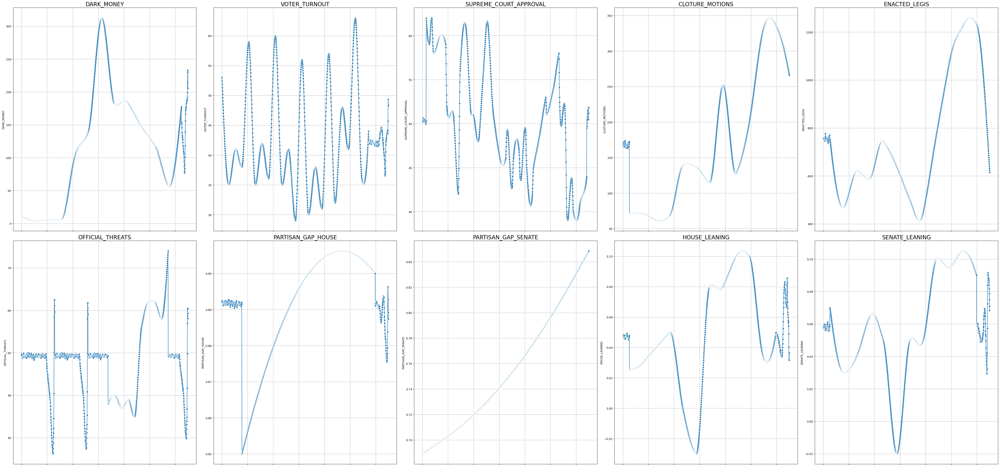

In [93]:
# Plot each variable in a mini-plot
fig, axes = plt.subplots(nrows=6, ncols=5, figsize=(50, 7*len(df_filled.columns)), sharex=True)

# Flatten the axes array for easy indexing
axes = axes.flatten()

for i, col in enumerate(df_filled.columns):
    sns.lineplot(data=df_filled, x=df_filled.index, y=col, ax=axes[i], marker='o')
    axes[i].set_title(f"{col}", fontsize=20)
    axes[i].set_ylabel(col)
    axes[i].grid(True)

# Hide any unused subplots (if num_vars is not a multiple of 5)
for i in range(len(df_filled.columns), len(axes)):
    fig.delaxes(axes[i])

plt.xlabel("DATE")
plt.tight_layout()
plt.show()

In [94]:
# Verify that there are no missing values
df_filled.isna().values.any()

False

In [95]:
# Define the output file path
output_file = "/content/drive/My Drive/G720_CLIENT4_GAN.xlsx"

# Save DataFrame to Excel
df_filled.to_excel(output_file, index=False, engine='openpyxl')

print(f"Data successfully saved to {output_file}")

Data successfully saved to /content/drive/My Drive/G720_CLIENT4_GAN.xlsx


### CLIENT 5

In [96]:
# Load the file from Google Drive
file_path = '/content/drive/My Drive/G720_CLIENT5_Noisy_Interpolated.xlsx'

# Load specified sheet
df = pd.read_excel(file_path, engine='openpyxl')

# Display the first few rows
print(df.head())

   PUBLIC_TUITION  PRIVATE_TUITION  COLLEGE_ENROLL  LOAN_DEBT  READING_PROF  \
0     3349.000000     14616.000000    1.531229e+07        NaN     32.500000   
1     3351.149310     14633.487606    1.532350e+07        NaN     32.516760   
2     3353.328048     14650.931280    1.533475e+07        NaN     32.533386   
3     3355.536267     14668.331153    1.534604e+07        NaN     32.549874   
4     3357.774023     14685.687356    1.535737e+07        NaN     32.566221   

   MATH_PROF  
0  26.000000  
1  26.024008  
2  26.047954  
3  26.071838  
4  26.095661  


In [99]:
# Print how many missing values are still in the data
print(df.isnull().sum())

PUBLIC_TUITION       0
PRIVATE_TUITION      0
COLLEGE_ENROLL      51
LOAN_DEBT            0
READING_PROF       311
MATH_PROF          311
dtype: int64


In [100]:
# Normalize data for GAN training using StandardScaler
scaler = StandardScaler()
data_scaled = scaler.fit_transform(df)

# Convert to 3D format (samples, timesteps, features)
def create_sequences(data, window_size):
    sequences = []
    for i in range(len(data) - window_size):
        sequences.append(data[i:i + window_size])
    return np.array(sequences)

window_size = 260  # 5 years of observations
train_data = create_sequences(data_scaled, window_size)

In [101]:
# Define the generator
def build_generator():
    model = Sequential([
        LSTM(100, return_sequences=True, activation='linear', input_shape=(1, noise_dim)),  # No built-in activation
        tf.keras.layers.LeakyReLU(alpha=0.2),  # Apply Leaky ReLU explicitly
        Dropout(0.2),

        LSTM(100, return_sequences=False, activation='linear'),  # No built-in activation
        tf.keras.layers.LeakyReLU(alpha=0.2),  # Apply Leaky ReLU explicitly

        Dense(df.shape[1] * window_size, activation='linear'),  # Keep final output linear
        tf.keras.layers.Reshape((window_size, df.shape[1]))  # Reshape to match expected shape
    ])
    return model

# Define the discriminator
def build_discriminator():
    model = Sequential([
        LSTM(100, return_sequences=True, activation='linear', input_shape=(window_size, df.shape[1])),
        tf.keras.layers.LeakyReLU(alpha=0.2),  # Apply Leaky ReLU explicitly
        Dropout(0.2),

        LSTM(50, return_sequences=False, activation='linear'),
        tf.keras.layers.LeakyReLU(alpha=0.2),  # Apply Leaky ReLU explicitly

        Dense(1, activation='linear')  # Output should remain linear
    ])
    return model

In [102]:
# Training Loop
epochs = 500
batch_size = 32
noise_dim = 50  # Noise dimension for the generator

# Initialize generator & discriminator
generator = build_generator()
discriminator = build_discriminator()

# Compile discriminator with clipnorm to prevent spiking in gradients
discriminator.compile(
    loss='mean_squared_error',
    optimizer=Adam(learning_rate=1e-4, beta_1=0.5, clipnorm=0.2),  # Use clipnorm for gradient clipping
    metrics=['mean_absolute_error']
)

# GAN Model (stack generator & discriminator)
gan_input = tf.keras.Input(shape=(noise_dim,))
reshaped_input = tf.keras.layers.Reshape((1, noise_dim))(gan_input)  # Reshape to (None, 1, noise_dim)
generated_data = generator(reshaped_input)  # Pass reshaped input through the generator
discriminator.trainable = False  # Freeze discriminator during GAN training
validity = discriminator(generated_data)
gan = tf.keras.Model(gan_input, validity)
# Compile GAN with gradient clipping
gan.compile(
    loss='mean_squared_error',
    optimizer=Adam(learning_rate=1e-4, beta_1=0.5, clipnorm=0.2)  # Use clipnorm for gradient clipping
)

# Helper function to get a batch of real data
def real_samples(batch_size):
    indices = np.random.randint(0, train_data.shape[0], batch_size)
    return train_data[indices]

# Helper function to generate fake data
def generate_fake_samples(batch_size):
    noise = np.random.normal(0, 1, (batch_size, noise_dim))  # Random noise
    noise = noise.reshape(batch_size, 1, noise_dim)  # Reshape to (batch_size, 1, noise_dim)
    fake_data = generator.predict(noise)  # Generate fake data from noise
    return fake_data

# Real labels (1 for real data) and fake labels (0 for fake data)
real_labels = np.ones((batch_size, 1))
fake_labels = np.zeros((batch_size, 1))

# Training loop
for epoch in range(epochs):
    # Train Discriminator
    real_data = real_samples(batch_size)  # Get real data
    fake_data = generate_fake_samples(batch_size)  # Get fake data generated by the GAN

    # Train the discriminator
    real_loss = discriminator.train_on_batch(real_data, real_labels)
    fake_loss = discriminator.train_on_batch(fake_data, fake_labels)

    # Extract the loss values from the tuples
    real_loss_value = real_loss[0]  # The first element is the loss
    fake_loss_value = fake_loss[0]  # The first element is the loss

    # Compute the discriminator loss as the average of real and fake losses
    d_loss = 0.5 * (real_loss_value + fake_loss_value)

    # Train Generator
    noise = np.random.normal(0, 1, (batch_size, noise_dim))  # Random noise for generator input
    g_loss = gan.train_on_batch(noise, real_labels)  # Generator tries to fool the discriminator

    # Print progress
    if epoch % 100 == 0:
        print(f"Epoch {epoch}: D Loss: {d_loss} | G Loss: {g_loss}")

/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
/usr/local/lib/python3.11/dist-packages/keras/src/layers/activations/leaky_relu.py:41: UserWarning: Argument `alpha` is deprecated. Use `negative_slope` instead.
  warnings.warn(


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 377ms/step


/usr/local/lib/python3.11/dist-packages/keras/src/backend/tensorflow/trainer.py:82: UserWarning: The model does not have any trainable weights.
  warnings.warn("The model does not have any trainable weights.")


Epoch 0: D Loss: nan | G Loss: 0.9999009966850281
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 59ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 73ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


In [103]:
# Generate new time-series sequences
noise = np.random.normal(0, 1, (df.shape[0], 1, noise_dim))  # Reshape to (batch_size, 1, noise_dim)
synthetic_data = generator.predict(noise)

# Apply Gaussian smoothing to the generated data
sigma = 1  # Standard deviation for the Gaussian filter (adjust based on smoothing strength)
synthetic_data_smoothed = gaussian_filter(synthetic_data, sigma=sigma)

# Rescale back to original values
synthetic_data_rescaled = scaler.inverse_transform(synthetic_data_smoothed.reshape(-1, df.shape[1]))

# Replace missing values in original dataset
df_filled = df.copy()

# Fill in missing data
for i in range(len(df_filled)):
    for j in range(df.shape[1]):  # Loop over features
        if np.isnan(df_filled.iloc[i, j]):
            df_filled.iloc[i, j] = synthetic_data_rescaled[i, j]

41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step


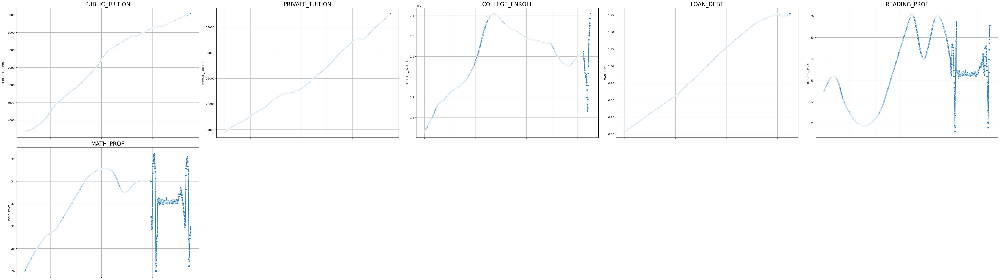

In [105]:
# Plot each variable in a mini-plot
fig, axes = plt.subplots(nrows=6, ncols=5, figsize=(50, 7*len(df_filled.columns)), sharex=True)

# Flatten the axes array for easy indexing
axes = axes.flatten()

for i, col in enumerate(df_filled.columns):
    sns.lineplot(data=df_filled, x=df_filled.index, y=col, ax=axes[i], marker='o')
    axes[i].set_title(f"{col}", fontsize=20)
    axes[i].set_ylabel(col)
    axes[i].grid(True)

# Hide any unused subplots (if num_vars is not a multiple of 5)
for i in range(len(df_filled.columns), len(axes)):
    fig.delaxes(axes[i])

plt.xlabel("DATE")
plt.tight_layout()
plt.show()

In [ ]:
# Verify that there are no missing values
df_filled.isna().values.any()

In [106]:
# Define the output file path
output_file = "/content/drive/My Drive/G720_CLIENT5_GAN.xlsx"

# Save DataFrame to Excel
df_filled.to_excel(output_file, index=False, engine='openpyxl')

print(f"Data successfully saved to {output_file}")

Data successfully saved to /content/drive/My Drive/G720_CLIENT5_GAN.xlsx


### CLIENT 6

In [107]:
# Load the file from Google Drive
file_path = '/content/drive/My Drive/G720_CLIENT6_Noisy_Interpolated.xlsx'

# Load specified sheet
df = pd.read_excel(file_path, engine='openpyxl')

# Display the first few rows
print(df.head())

    OIL_PROD  NATGAS_PROD  RENEW_PROD  PETROL_CONSUMP  NATGAS_CONSUMP  \
0  12.450000    19.340000    4.200000       37.730000       22.910000   
1  12.448176    19.344388    4.202293       37.742754       22.946000   
2  12.446358    19.348895    4.204366       37.755435       22.981306   
3  12.444545    19.353519    4.206221       37.768037       23.015916   
4  12.442738    19.358256    4.207862       37.780552       23.049828   

   RENEW_CONSUMP  EMISSIONS  HYBRID_VEHICLES  ELECTRIC_VEHICLES  \
0       4.200000   7.370000      9350.000000                0.0   
1       4.202674   7.366161      9514.643257                0.0   
2       4.205121   7.362338      9680.962127                0.0   
3       4.207343   7.358533      9848.963339                0.0   
4       4.209345   7.354749     10018.653620                0.0   

   FEMA_SPENDING  NATURAL_DISASTERS  SURFACE_TEMP  
0       0.860700           5.000000      1.860000  
1       0.874704           4.913997      1.838543  
2 

In [108]:
# Print how many missing values are still in the data
print(df.isnull().sum())

OIL_PROD               0
NATGAS_PROD            0
RENEW_PROD             0
PETROL_CONSUMP         0
NATGAS_CONSUMP         0
RENEW_CONSUMP          0
EMISSIONS            156
HYBRID_VEHICLES      156
ELECTRIC_VEHICLES    156
FEMA_SPENDING         52
NATURAL_DISASTERS      0
SURFACE_TEMP           0
dtype: int64


In [109]:
# Normalize data for GAN training using StandardScaler
scaler = StandardScaler()
data_scaled = scaler.fit_transform(df)

# Convert to 3D format (samples, timesteps, features)
def create_sequences(data, window_size):
    sequences = []
    for i in range(len(data) - window_size):
        sequences.append(data[i:i + window_size])
    return np.array(sequences)

window_size = 260  # 5 years of observations
train_data = create_sequences(data_scaled, window_size)

In [110]:
# Define the generator
def build_generator():
    model = Sequential([
        LSTM(100, return_sequences=True, activation='linear', input_shape=(1, noise_dim)),  # No built-in activation
        tf.keras.layers.LeakyReLU(alpha=0.2),  # Apply Leaky ReLU explicitly
        Dropout(0.2),

        LSTM(100, return_sequences=False, activation='linear'),  # No built-in activation
        tf.keras.layers.LeakyReLU(alpha=0.2),  # Apply Leaky ReLU explicitly

        Dense(df.shape[1] * window_size, activation='linear'),  # Keep final output linear
        tf.keras.layers.Reshape((window_size, df.shape[1]))  # Reshape to match expected shape
    ])
    return model

# Define the discriminator
def build_discriminator():
    model = Sequential([
        LSTM(100, return_sequences=True, activation='linear', input_shape=(window_size, df.shape[1])),
        tf.keras.layers.LeakyReLU(alpha=0.2),  # Apply Leaky ReLU explicitly
        Dropout(0.2),

        LSTM(50, return_sequences=False, activation='linear'),
        tf.keras.layers.LeakyReLU(alpha=0.2),  # Apply Leaky ReLU explicitly

        Dense(1, activation='linear')  # Output should remain linear
    ])
    return model

In [111]:
# Training Loop
epochs = 500
batch_size = 32
noise_dim = 50  # Noise dimension for the generator

# Initialize generator & discriminator
generator = build_generator()
discriminator = build_discriminator()

# Compile discriminator with clipnorm to prevent spiking in gradients
discriminator.compile(
    loss='mean_squared_error',
    optimizer=Adam(learning_rate=1e-4, beta_1=0.5, clipnorm=0.2),  # Use clipnorm for gradient clipping
    metrics=['mean_absolute_error']
)

# GAN Model (stack generator & discriminator)
gan_input = tf.keras.Input(shape=(noise_dim,))
reshaped_input = tf.keras.layers.Reshape((1, noise_dim))(gan_input)  # Reshape to (None, 1, noise_dim)
generated_data = generator(reshaped_input)  # Pass reshaped input through the generator
discriminator.trainable = False  # Freeze discriminator during GAN training
validity = discriminator(generated_data)
gan = tf.keras.Model(gan_input, validity)
# Compile GAN with gradient clipping
gan.compile(
    loss='mean_squared_error',
    optimizer=Adam(learning_rate=1e-4, beta_1=0.5, clipnorm=0.2)  # Use clipnorm for gradient clipping
)

# Helper function to get a batch of real data
def real_samples(batch_size):
    indices = np.random.randint(0, train_data.shape[0], batch_size)
    return train_data[indices]

# Helper function to generate fake data
def generate_fake_samples(batch_size):
    noise = np.random.normal(0, 1, (batch_size, noise_dim))  # Random noise
    noise = noise.reshape(batch_size, 1, noise_dim)  # Reshape to (batch_size, 1, noise_dim)
    fake_data = generator.predict(noise)  # Generate fake data from noise
    return fake_data

# Real labels (1 for real data) and fake labels (0 for fake data)
real_labels = np.ones((batch_size, 1))
fake_labels = np.zeros((batch_size, 1))

# Training loop
for epoch in range(epochs):
    # Train Discriminator
    real_data = real_samples(batch_size)  # Get real data
    fake_data = generate_fake_samples(batch_size)  # Get fake data generated by the GAN

    # Train the discriminator
    real_loss = discriminator.train_on_batch(real_data, real_labels)
    fake_loss = discriminator.train_on_batch(fake_data, fake_labels)

    # Extract the loss values from the tuples
    real_loss_value = real_loss[0]  # The first element is the loss
    fake_loss_value = fake_loss[0]  # The first element is the loss

    # Compute the discriminator loss as the average of real and fake losses
    d_loss = 0.5 * (real_loss_value + fake_loss_value)

    # Train Generator
    noise = np.random.normal(0, 1, (batch_size, noise_dim))  # Random noise for generator input
    g_loss = gan.train_on_batch(noise, real_labels)  # Generator tries to fool the discriminator

    # Print progress
    if epoch % 100 == 0:
        print(f"Epoch {epoch}: D Loss: {d_loss} | G Loss: {g_loss}")

/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
/usr/local/lib/python3.11/dist-packages/keras/src/layers/activations/leaky_relu.py:41: UserWarning: Argument `alpha` is deprecated. Use `negative_slope` instead.
  warnings.warn(


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 400ms/step


/usr/local/lib/python3.11/dist-packages/keras/src/backend/tensorflow/trainer.py:82: UserWarning: The model does not have any trainable weights.
  warnings.warn("The model does not have any trainable weights.")


Epoch 0: D Loss: nan | G Loss: 0.9999645352363586
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 59ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step


In [112]:
# Generate new time-series sequences
noise = np.random.normal(0, 1, (df.shape[0], 1, noise_dim))  # Reshape to (batch_size, 1, noise_dim)
synthetic_data = generator.predict(noise)

# Apply Gaussian smoothing to the generated data
sigma = 1  # Standard deviation for the Gaussian filter (adjust based on smoothing strength)
synthetic_data_smoothed = gaussian_filter(synthetic_data, sigma=sigma)

# Rescale back to original values
synthetic_data_rescaled = scaler.inverse_transform(synthetic_data_smoothed.reshape(-1, df.shape[1]))

# Replace missing values in original dataset
df_filled = df.copy()

# Fill in missing data
for i in range(len(df_filled)):
    for j in range(df.shape[1]):  # Loop over features
        if np.isnan(df_filled.iloc[i, j]):
            df_filled.iloc[i, j] = synthetic_data_rescaled[i, j]

40/40 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step


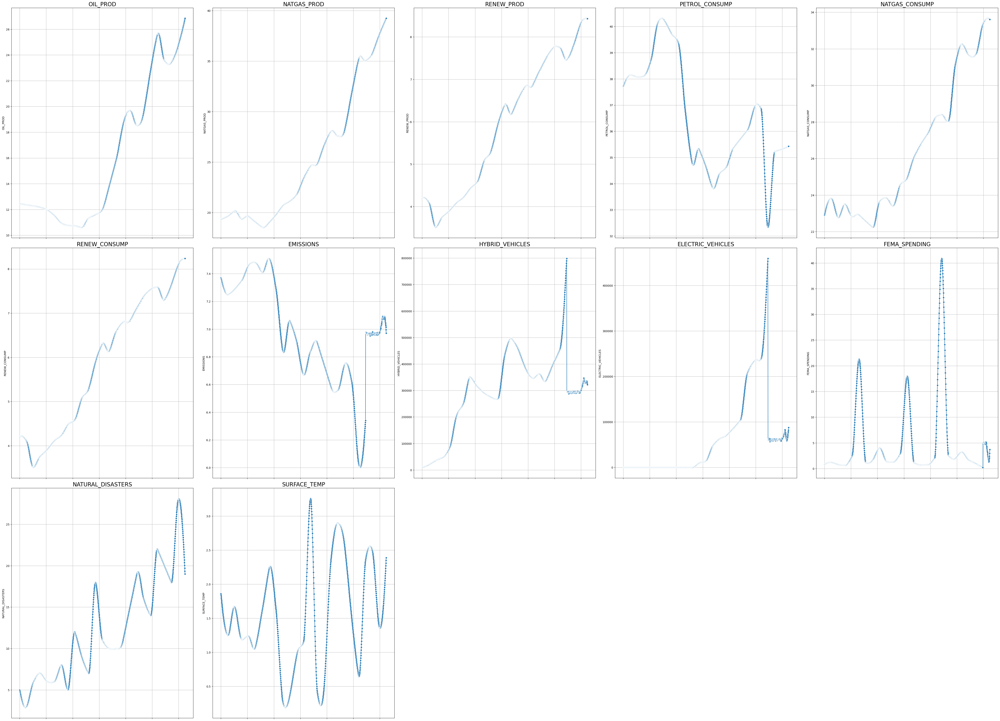

In [113]:
# Plot each variable in a mini-plot
fig, axes = plt.subplots(nrows=6, ncols=5, figsize=(50, 6*len(df_filled.columns)), sharex=True)

# Flatten the axes array for easy indexing
axes = axes.flatten()

for i, col in enumerate(df_filled.columns):
    sns.lineplot(data=df_filled, x=df_filled.index, y=col, ax=axes[i], marker='o')
    axes[i].set_title(f"{col}", fontsize=20)
    axes[i].set_ylabel(col)
    axes[i].grid(True)

# Hide any unused subplots (if num_vars is not a multiple of 5)
for i in range(len(df_filled.columns), len(axes)):
    fig.delaxes(axes[i])

plt.xlabel("DATE")
plt.tight_layout()
plt.show()

In [ ]:
# Verify that there are no missing values
df_filled.isna().values.any()

In [114]:
# Define the output file path
output_file = "/content/drive/My Drive/G720_CLIENT6_GAN.xlsx"

# Save DataFrame to Excel
df_filled.to_excel(output_file, index=False, engine='openpyxl')

print(f"Data successfully saved to {output_file}")

Data successfully saved to /content/drive/My Drive/G720_CLIENT6_GAN.xlsx


### CLIENT 7

In [117]:
# Load the file from Google Drive
file_path = '/content/drive/My Drive/G720_CLIENT7_Noisy_Interpolated.xlsx'

# Load specified sheet
df = pd.read_excel(file_path, engine='openpyxl')

# Display the first few rows
print(df.head())

   BORDER_ENCOUNTERS  IMMIGRANT_POP  UNDOCUMENTED_POP  BORDER_SPENDING  \
0                NaN   3.110789e+07      8.460000e+06         6.900000   
1                NaN   3.111650e+07      8.463841e+06         6.869708   
2                NaN   3.112519e+07      8.467710e+06         6.840563   
3                NaN   3.113397e+07      8.471607e+06         6.812561   
4                NaN   3.114282e+07      8.475532e+06         6.785700   

   DEPORTATIONS  ASYLUM_APPS  
0           NaN          NaN  
1           NaN          NaN  
2           NaN          NaN  
3           NaN          NaN  
4           NaN          NaN  


In [119]:
# Print how many missing values are still in the data
print(df.isnull().sum())

BORDER_ENCOUNTERS     43
IMMIGRANT_POP          0
UNDOCUMENTED_POP     355
BORDER_SPENDING       95
DEPORTATIONS         715
ASYLUM_APPS          927
dtype: int64


In [120]:
# Normalize data for GAN training using StandardScaler
scaler = StandardScaler()
data_scaled = scaler.fit_transform(df)

# Convert to 3D format (samples, timesteps, features)
def create_sequences(data, window_size):
    sequences = []
    for i in range(len(data) - window_size):
        sequences.append(data[i:i + window_size])
    return np.array(sequences)

window_size = 260  # 5 years of observations
train_data = create_sequences(data_scaled, window_size)

In [121]:
# Define the generator
def build_generator():
    model = Sequential([
        LSTM(100, return_sequences=True, activation='linear', input_shape=(1, noise_dim)),  # No built-in activation
        tf.keras.layers.LeakyReLU(alpha=0.2),  # Apply Leaky ReLU explicitly
        Dropout(0.2),

        LSTM(100, return_sequences=False, activation='linear'),  # No built-in activation
        tf.keras.layers.LeakyReLU(alpha=0.2),  # Apply Leaky ReLU explicitly

        Dense(df.shape[1] * window_size, activation='linear'),  # Keep final output linear
        tf.keras.layers.Reshape((window_size, df.shape[1]))  # Reshape to match expected shape
    ])
    return model

# Define the discriminator
def build_discriminator():
    model = Sequential([
        LSTM(100, return_sequences=True, activation='linear', input_shape=(window_size, df.shape[1])),
        tf.keras.layers.LeakyReLU(alpha=0.2),  # Apply Leaky ReLU explicitly
        Dropout(0.2),

        LSTM(50, return_sequences=False, activation='linear'),
        tf.keras.layers.LeakyReLU(alpha=0.2),  # Apply Leaky ReLU explicitly

        Dense(1, activation='linear')  # Output should remain linear
    ])
    return model

In [122]:
# Training Loop
epochs = 500
batch_size = 32
noise_dim = 50  # Noise dimension for the generator

# Initialize generator & discriminator
generator = build_generator()
discriminator = build_discriminator()

# Compile discriminator with clipnorm to prevent spiking in gradients
discriminator.compile(
    loss='mean_squared_error',
    optimizer=Adam(learning_rate=1e-4, beta_1=0.5, clipnorm=0.2),  # Use clipnorm for gradient clipping
    metrics=['mean_absolute_error']
)

# GAN Model (stack generator & discriminator)
gan_input = tf.keras.Input(shape=(noise_dim,))
reshaped_input = tf.keras.layers.Reshape((1, noise_dim))(gan_input)  # Reshape to (None, 1, noise_dim)
generated_data = generator(reshaped_input)  # Pass reshaped input through the generator
discriminator.trainable = False  # Freeze discriminator during GAN training
validity = discriminator(generated_data)
gan = tf.keras.Model(gan_input, validity)
# Compile GAN with gradient clipping
gan.compile(
    loss='mean_squared_error',
    optimizer=Adam(learning_rate=1e-4, beta_1=0.5, clipnorm=0.2)  # Use clipnorm for gradient clipping
)

# Helper function to get a batch of real data
def real_samples(batch_size):
    indices = np.random.randint(0, train_data.shape[0], batch_size)
    return train_data[indices]

# Helper function to generate fake data
def generate_fake_samples(batch_size):
    noise = np.random.normal(0, 1, (batch_size, noise_dim))  # Random noise
    noise = noise.reshape(batch_size, 1, noise_dim)  # Reshape to (batch_size, 1, noise_dim)
    fake_data = generator.predict(noise)  # Generate fake data from noise
    return fake_data

# Real labels (1 for real data) and fake labels (0 for fake data)
real_labels = np.ones((batch_size, 1))
fake_labels = np.zeros((batch_size, 1))

# Training loop
for epoch in range(epochs):
    # Train Discriminator
    real_data = real_samples(batch_size)  # Get real data
    fake_data = generate_fake_samples(batch_size)  # Get fake data generated by the GAN

    # Train the discriminator
    real_loss = discriminator.train_on_batch(real_data, real_labels)
    fake_loss = discriminator.train_on_batch(fake_data, fake_labels)

    # Extract the loss values from the tuples
    real_loss_value = real_loss[0]  # The first element is the loss
    fake_loss_value = fake_loss[0]  # The first element is the loss

    # Compute the discriminator loss as the average of real and fake losses
    d_loss = 0.5 * (real_loss_value + fake_loss_value)

    # Train Generator
    noise = np.random.normal(0, 1, (batch_size, noise_dim))  # Random noise for generator input
    g_loss = gan.train_on_batch(noise, real_labels)  # Generator tries to fool the discriminator

    # Print progress
    if epoch % 100 == 0:
        print(f"Epoch {epoch}: D Loss: {d_loss} | G Loss: {g_loss}")

/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
/usr/local/lib/python3.11/dist-packages/keras/src/layers/activations/leaky_relu.py:41: UserWarning: Argument `alpha` is deprecated. Use `negative_slope` instead.
  warnings.warn(


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 374ms/step


/usr/local/lib/python3.11/dist-packages/keras/src/backend/tensorflow/trainer.py:82: UserWarning: The model does not have any trainable weights.
  warnings.warn("The model does not have any trainable weights.")


Epoch 0: D Loss: nan | G Loss: 1.0001649856567383
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step


In [123]:
# Generate new time-series sequences
noise = np.random.normal(0, 1, (df.shape[0], 1, noise_dim))  # Reshape to (batch_size, 1, noise_dim)
synthetic_data = generator.predict(noise)

# Apply Gaussian smoothing to the generated data
sigma = 1  # Standard deviation for the Gaussian filter (adjust based on smoothing strength)
synthetic_data_smoothed = gaussian_filter(synthetic_data, sigma=sigma)

# Rescale back to original values
synthetic_data_rescaled = scaler.inverse_transform(synthetic_data_smoothed.reshape(-1, df.shape[1]))

# Replace missing values in original dataset
df_filled = df.copy()

# Fill in missing data
for i in range(len(df_filled)):
    for j in range(df.shape[1]):  # Loop over features
        if np.isnan(df_filled.iloc[i, j]):
            df_filled.iloc[i, j] = synthetic_data_rescaled[i, j]

41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step


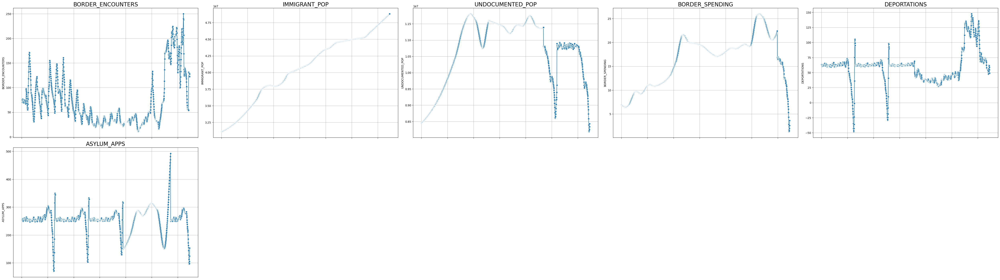

In [125]:
# Plot each variable in a mini-plot
fig, axes = plt.subplots(nrows=6, ncols=5, figsize=(50, 7*len(df_filled.columns)), sharex=True)

# Flatten the axes array for easy indexing
axes = axes.flatten()

for i, col in enumerate(df_filled.columns):
    sns.lineplot(data=df_filled, x=df_filled.index, y=col, ax=axes[i], marker='o')
    axes[i].set_title(f"{col}", fontsize=20)
    axes[i].set_ylabel(col)
    axes[i].grid(True)

# Hide any unused subplots (if num_vars is not a multiple of 5)
for i in range(len(df_filled.columns), len(axes)):
    fig.delaxes(axes[i])

plt.xlabel("DATE")
plt.tight_layout()
plt.show()

In [ ]:
# Verify that there are no missing values
df_filled.isna().values.any()

In [126]:
# Define the output file path
output_file = "/content/drive/My Drive/G720_CLIENT7_GAN.xlsx"

# Save DataFrame to Excel
df_filled.to_excel(output_file, index=False, engine='openpyxl')

print(f"Data successfully saved to {output_file}")

Data successfully saved to /content/drive/My Drive/G720_CLIENT7_GAN.xlsx


### CLIENT 8

In [127]:
# Load the file from Google Drive
file_path = '/content/drive/My Drive/G720_CLIENT8_Noisy_Interpolated.xlsx'

# Load specified sheet
df = pd.read_excel(file_path, engine='openpyxl')

# Display the first few rows
print(df.head())

   LGBTQ_IDENTITY  HOMELESS_POP  FERTILITY_RATE  USA_POPULATION  WHITE_POP  \
0             NaN           NaN       65.900000    2.821719e+08  69.400000   
1             NaN           NaN       65.878047    2.822270e+08  69.388462   
2             NaN           NaN       65.856418    2.822821e+08  69.376923   
3             NaN           NaN       65.835108    2.823371e+08  69.365385   
4             NaN           NaN       65.814113    2.823920e+08  69.353846   

   HISPANIC_POP  BLACK_POP  AAPI_POP  CHRISTIAN_POP  NON_RELIGIOUS_POP  
0     12.600000       12.2  3.800000      86.000000           8.000000  
1     12.607692       12.2  3.804807      86.018982           7.981139  
2     12.615385       12.2  3.809613      86.037456           7.963018  
3     12.623077       12.2  3.814413      86.055409           7.945636  
4     12.630769       12.2  3.819208      86.072827           7.928994  


In [129]:
# Print how many missing values are still in the data
print(df.isnull().sum())

LGBTQ_IDENTITY       624
HOMELESS_POP         364
FERTILITY_RATE         0
USA_POPULATION         0
WHITE_POP              0
HISPANIC_POP           0
BLACK_POP              0
AAPI_POP               0
CHRISTIAN_POP          0
NON_RELIGIOUS_POP      0
dtype: int64


In [130]:
# Normalize data for GAN training using StandardScaler
scaler = StandardScaler()
data_scaled = scaler.fit_transform(df)

# Convert to 3D format (samples, timesteps, features)
def create_sequences(data, window_size):
    sequences = []
    for i in range(len(data) - window_size):
        sequences.append(data[i:i + window_size])
    return np.array(sequences)

window_size = 260  # 5 years of observations
train_data = create_sequences(data_scaled, window_size)

In [131]:
# Define the generator
def build_generator():
    model = Sequential([
        LSTM(100, return_sequences=True, activation='linear', input_shape=(1, noise_dim)),  # No built-in activation
        tf.keras.layers.LeakyReLU(alpha=0.2),  # Apply Leaky ReLU explicitly
        Dropout(0.2),

        LSTM(100, return_sequences=False, activation='linear'),  # No built-in activation
        tf.keras.layers.LeakyReLU(alpha=0.2),  # Apply Leaky ReLU explicitly

        Dense(df.shape[1] * window_size, activation='linear'),  # Keep final output linear
        tf.keras.layers.Reshape((window_size, df.shape[1]))  # Reshape to match expected shape
    ])
    return model

# Define the discriminator
def build_discriminator():
    model = Sequential([
        LSTM(100, return_sequences=True, activation='linear', input_shape=(window_size, df.shape[1])),
        tf.keras.layers.LeakyReLU(alpha=0.2),  # Apply Leaky ReLU explicitly
        Dropout(0.2),

        LSTM(50, return_sequences=False, activation='linear'),
        tf.keras.layers.LeakyReLU(alpha=0.2),  # Apply Leaky ReLU explicitly

        Dense(1, activation='linear')  # Output should remain linear
    ])
    return model

In [132]:
# Training Loop
epochs = 500
batch_size = 32
noise_dim = 50  # Noise dimension for the generator

# Initialize generator & discriminator
generator = build_generator()
discriminator = build_discriminator()

# Compile discriminator with clipnorm to prevent spiking in gradients
discriminator.compile(
    loss='mean_squared_error',
    optimizer=Adam(learning_rate=1e-4, beta_1=0.5, clipnorm=0.2),  # Use clipnorm for gradient clipping
    metrics=['mean_absolute_error']
)

# GAN Model (stack generator & discriminator)
gan_input = tf.keras.Input(shape=(noise_dim,))
reshaped_input = tf.keras.layers.Reshape((1, noise_dim))(gan_input)  # Reshape to (None, 1, noise_dim)
generated_data = generator(reshaped_input)  # Pass reshaped input through the generator
discriminator.trainable = False  # Freeze discriminator during GAN training
validity = discriminator(generated_data)
gan = tf.keras.Model(gan_input, validity)
# Compile GAN with gradient clipping
gan.compile(
    loss='mean_squared_error',
    optimizer=Adam(learning_rate=1e-4, beta_1=0.5, clipnorm=0.2)  # Use clipnorm for gradient clipping
)

# Helper function to get a batch of real data
def real_samples(batch_size):
    indices = np.random.randint(0, train_data.shape[0], batch_size)
    return train_data[indices]

# Helper function to generate fake data
def generate_fake_samples(batch_size):
    noise = np.random.normal(0, 1, (batch_size, noise_dim))  # Random noise
    noise = noise.reshape(batch_size, 1, noise_dim)  # Reshape to (batch_size, 1, noise_dim)
    fake_data = generator.predict(noise)  # Generate fake data from noise
    return fake_data

# Real labels (1 for real data) and fake labels (0 for fake data)
real_labels = np.ones((batch_size, 1))
fake_labels = np.zeros((batch_size, 1))

# Training loop
for epoch in range(epochs):
    # Train Discriminator
    real_data = real_samples(batch_size)  # Get real data
    fake_data = generate_fake_samples(batch_size)  # Get fake data generated by the GAN

    # Train the discriminator
    real_loss = discriminator.train_on_batch(real_data, real_labels)
    fake_loss = discriminator.train_on_batch(fake_data, fake_labels)

    # Extract the loss values from the tuples
    real_loss_value = real_loss[0]  # The first element is the loss
    fake_loss_value = fake_loss[0]  # The first element is the loss

    # Compute the discriminator loss as the average of real and fake losses
    d_loss = 0.5 * (real_loss_value + fake_loss_value)

    # Train Generator
    noise = np.random.normal(0, 1, (batch_size, noise_dim))  # Random noise for generator input
    g_loss = gan.train_on_batch(noise, real_labels)  # Generator tries to fool the discriminator

    # Print progress
    if epoch % 100 == 0:
        print(f"Epoch {epoch}: D Loss: {d_loss} | G Loss: {g_loss}")

/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
/usr/local/lib/python3.11/dist-packages/keras/src/layers/activations/leaky_relu.py:41: UserWarning: Argument `alpha` is deprecated. Use `negative_slope` instead.
  warnings.warn(


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 429ms/step


/usr/local/lib/python3.11/dist-packages/keras/src/backend/tensorflow/trainer.py:82: UserWarning: The model does not have any trainable weights.
  warnings.warn("The model does not have any trainable weights.")


Epoch 0: D Loss: nan | G Loss: 0.9999397993087769
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 59ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step


In [133]:
# Generate new time-series sequences
noise = np.random.normal(0, 1, (df.shape[0], 1, noise_dim))  # Reshape to (batch_size, 1, noise_dim)
synthetic_data = generator.predict(noise)

# Apply Gaussian smoothing to the generated data
sigma = 1  # Standard deviation for the Gaussian filter (adjust based on smoothing strength)
synthetic_data_smoothed = gaussian_filter(synthetic_data, sigma=sigma)

# Rescale back to original values
synthetic_data_rescaled = scaler.inverse_transform(synthetic_data_smoothed.reshape(-1, df.shape[1]))

# Replace missing values in original dataset
df_filled = df.copy()

# Fill in missing data
for i in range(len(df_filled)):
    for j in range(df.shape[1]):  # Loop over features
        if np.isnan(df_filled.iloc[i, j]):
            df_filled.iloc[i, j] = synthetic_data_rescaled[i, j]

38/38 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step


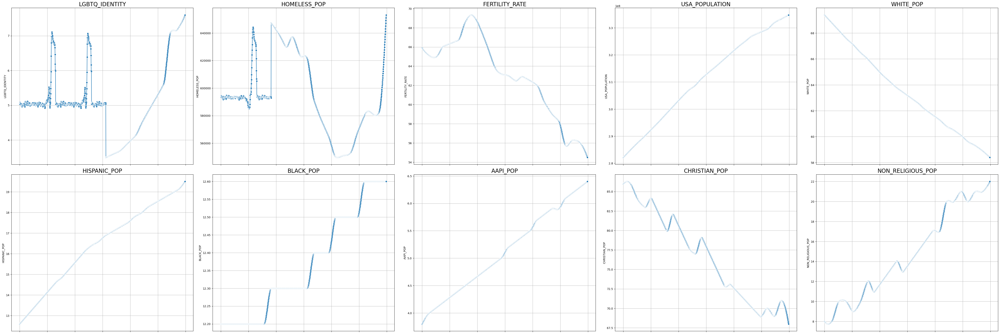

In [135]:
# Plot each variable in a mini-plot
fig, axes = plt.subplots(nrows=6, ncols=5, figsize=(50, 5*len(df_filled.columns)), sharex=True)

# Flatten the axes array for easy indexing
axes = axes.flatten()

for i, col in enumerate(df_filled.columns):
    sns.lineplot(data=df_filled, x=df_filled.index, y=col, ax=axes[i], marker='o')
    axes[i].set_title(f"{col}", fontsize=20)
    axes[i].set_ylabel(col)
    axes[i].grid(True)

# Hide any unused subplots (if num_vars is not a multiple of 5)
for i in range(len(df_filled.columns), len(axes)):
    fig.delaxes(axes[i])

plt.xlabel("DATE")
plt.tight_layout()
plt.show()

In [ ]:
# Verify that there are no missing values
df_filled.isna().values.any()

In [136]:
# Define the output file path
output_file = "/content/drive/My Drive/G720_CLIENT8_GAN.xlsx"

# Save DataFrame to Excel
df_filled.to_excel(output_file, index=False, engine='openpyxl')

print(f"Data successfully saved to {output_file}")

Data successfully saved to /content/drive/My Drive/G720_CLIENT8_GAN.xlsx


### CLIENT 9

In [137]:
# Load the file from Google Drive
file_path = '/content/drive/My Drive/G720_CLIENT9_Noisy_Interpolated.xlsx'

# Load specified sheet
df = pd.read_excel(file_path, engine='openpyxl')

# Display the first few rows
print(df.head())

   FOREIGN_AID  MIL_APPLICANTS  GLOBAL_INVOLVE_OPINION  MIL_DEATHS
0    30.300000   365348.000000                     NaN  832.000000
1    30.175723   365370.123097                     NaN  833.866742
2    30.054791   365396.424258                     NaN  835.736151
3    29.937170   365426.801288                     NaN  837.608154
4    29.822824   365461.151992                     NaN  839.482678


In [138]:
# Print how many missing values are still in the data
print(df.isnull().sum())

FOREIGN_AID                52
MIL_APPLICANTS            156
GLOBAL_INVOLVE_OPINION     52
MIL_DEATHS                 52
dtype: int64


In [139]:
# Normalize data for GAN training using StandardScaler
scaler = StandardScaler()
data_scaled = scaler.fit_transform(df)

# Convert to 3D format (samples, timesteps, features)
def create_sequences(data, window_size):
    sequences = []
    for i in range(len(data) - window_size):
        sequences.append(data[i:i + window_size])
    return np.array(sequences)

window_size = 260  # 5 years of observations
train_data = create_sequences(data_scaled, window_size)

In [140]:
# Define the generator
def build_generator():
    model = Sequential([
        LSTM(100, return_sequences=True, activation='linear', input_shape=(1, noise_dim)),  # No built-in activation
        tf.keras.layers.LeakyReLU(alpha=0.2),  # Apply Leaky ReLU explicitly
        Dropout(0.2),

        LSTM(100, return_sequences=False, activation='linear'),  # No built-in activation
        tf.keras.layers.LeakyReLU(alpha=0.2),  # Apply Leaky ReLU explicitly

        Dense(df.shape[1] * window_size, activation='linear'),  # Keep final output linear
        tf.keras.layers.Reshape((window_size, df.shape[1]))  # Reshape to match expected shape
    ])
    return model

# Define the discriminator
def build_discriminator():
    model = Sequential([
        LSTM(100, return_sequences=True, activation='linear', input_shape=(window_size, df.shape[1])),
        tf.keras.layers.LeakyReLU(alpha=0.2),  # Apply Leaky ReLU explicitly
        Dropout(0.2),

        LSTM(50, return_sequences=False, activation='linear'),
        tf.keras.layers.LeakyReLU(alpha=0.2),  # Apply Leaky ReLU explicitly

        Dense(1, activation='linear')  # Output should remain linear
    ])
    return model

In [141]:
# Training Loop
epochs = 500
batch_size = 32
noise_dim = 50  # Noise dimension for the generator

# Initialize generator & discriminator
generator = build_generator()
discriminator = build_discriminator()

# Compile discriminator with clipnorm to prevent spiking in gradients
discriminator.compile(
    loss='mean_squared_error',
    optimizer=Adam(learning_rate=1e-4, beta_1=0.5, clipnorm=0.2),  # Use clipnorm for gradient clipping
    metrics=['mean_absolute_error']
)

# GAN Model (stack generator & discriminator)
gan_input = tf.keras.Input(shape=(noise_dim,))
reshaped_input = tf.keras.layers.Reshape((1, noise_dim))(gan_input)  # Reshape to (None, 1, noise_dim)
generated_data = generator(reshaped_input)  # Pass reshaped input through the generator
discriminator.trainable = False  # Freeze discriminator during GAN training
validity = discriminator(generated_data)
gan = tf.keras.Model(gan_input, validity)
# Compile GAN with gradient clipping
gan.compile(
    loss='mean_squared_error',
    optimizer=Adam(learning_rate=1e-4, beta_1=0.5, clipnorm=0.2)  # Use clipnorm for gradient clipping
)

# Helper function to get a batch of real data
def real_samples(batch_size):
    indices = np.random.randint(0, train_data.shape[0], batch_size)
    return train_data[indices]

# Helper function to generate fake data
def generate_fake_samples(batch_size):
    noise = np.random.normal(0, 1, (batch_size, noise_dim))  # Random noise
    noise = noise.reshape(batch_size, 1, noise_dim)  # Reshape to (batch_size, 1, noise_dim)
    fake_data = generator.predict(noise)  # Generate fake data from noise
    return fake_data

# Real labels (1 for real data) and fake labels (0 for fake data)
real_labels = np.ones((batch_size, 1))
fake_labels = np.zeros((batch_size, 1))

# Training loop
for epoch in range(epochs):
    # Train Discriminator
    real_data = real_samples(batch_size)  # Get real data
    fake_data = generate_fake_samples(batch_size)  # Get fake data generated by the GAN

    # Train the discriminator
    real_loss = discriminator.train_on_batch(real_data, real_labels)
    fake_loss = discriminator.train_on_batch(fake_data, fake_labels)

    # Extract the loss values from the tuples
    real_loss_value = real_loss[0]  # The first element is the loss
    fake_loss_value = fake_loss[0]  # The first element is the loss

    # Compute the discriminator loss as the average of real and fake losses
    d_loss = 0.5 * (real_loss_value + fake_loss_value)

    # Train Generator
    noise = np.random.normal(0, 1, (batch_size, noise_dim))  # Random noise for generator input
    g_loss = gan.train_on_batch(noise, real_labels)  # Generator tries to fool the discriminator

    # Print progress
    if epoch % 100 == 0:
        print(f"Epoch {epoch}: D Loss: {d_loss} | G Loss: {g_loss}")

/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
/usr/local/lib/python3.11/dist-packages/keras/src/layers/activations/leaky_relu.py:41: UserWarning: Argument `alpha` is deprecated. Use `negative_slope` instead.
  warnings.warn(


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 334ms/step


/usr/local/lib/python3.11/dist-packages/keras/src/backend/tensorflow/trainer.py:82: UserWarning: The model does not have any trainable weights.
  warnings.warn("The model does not have any trainable weights.")


Epoch 0: D Loss: nan | G Loss: 1.000117540359497
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step
1

In [142]:
# Generate new time-series sequences
noise = np.random.normal(0, 1, (df.shape[0], 1, noise_dim))  # Reshape to (batch_size, 1, noise_dim)
synthetic_data = generator.predict(noise)

# Apply Gaussian smoothing to the generated data
sigma = 1  # Standard deviation for the Gaussian filter (adjust based on smoothing strength)
synthetic_data_smoothed = gaussian_filter(synthetic_data, sigma=sigma)

# Rescale back to original values
synthetic_data_rescaled = scaler.inverse_transform(synthetic_data_smoothed.reshape(-1, df.shape[1]))

# Replace missing values in original dataset
df_filled = df.copy()

# Fill in missing data
for i in range(len(df_filled)):
    for j in range(df.shape[1]):  # Loop over features
        if np.isnan(df_filled.iloc[i, j]):
            df_filled.iloc[i, j] = synthetic_data_rescaled[i, j]

38/38 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step


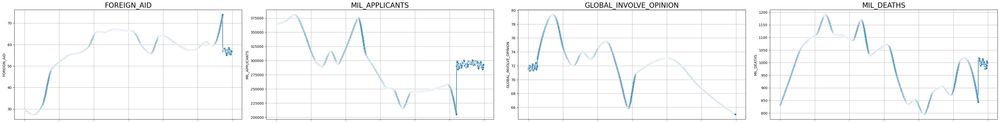

In [144]:
# Plot each variable in a mini-plot
fig, axes = plt.subplots(nrows=6, ncols=5, figsize=(50, 7*len(df_filled.columns)), sharex=True)

# Flatten the axes array for easy indexing
axes = axes.flatten()

for i, col in enumerate(df_filled.columns):
    sns.lineplot(data=df_filled, x=df_filled.index, y=col, ax=axes[i], marker='o')
    axes[i].set_title(f"{col}", fontsize=20)
    axes[i].set_ylabel(col)
    axes[i].grid(True)

# Hide any unused subplots (if num_vars is not a multiple of 5)
for i in range(len(df_filled.columns), len(axes)):
    fig.delaxes(axes[i])

plt.xlabel("DATE")
plt.tight_layout()
plt.show()

In [ ]:
# Verify that there are no missing values
df_filled.isna().values.any()

In [145]:
# Define the output file path
output_file = "/content/drive/My Drive/G720_CLIENT9_GAN.xlsx"

# Save DataFrame to Excel
df_filled.to_excel(output_file, index=False, engine='openpyxl')

print(f"Data successfully saved to {output_file}")

Data successfully saved to /content/drive/My Drive/G720_CLIENT9_GAN.xlsx


### CLIENT 10

In [146]:
# Load the file from Google Drive
file_path = '/content/drive/My Drive/G720_CLIENT10_Noisy_Interpolated.xlsx'

# Load specified sheet
df = pd.read_excel(file_path, engine='openpyxl')

# Display the first few rows
print(df.head())

   GOOD_BRIDGES  UNSATIS_ROADS
0           NaN      17.390000
1           NaN      17.383944
2           NaN      17.377701
3           NaN      17.371277
4           NaN      17.364674


In [147]:
# Print how many missing values are still in the data
print(df.isnull().sum())

GOOD_BRIDGES     624
UNSATIS_ROADS    156
dtype: int64


In [148]:
# Normalize data for GAN training using StandardScaler
scaler = StandardScaler()
data_scaled = scaler.fit_transform(df)

# Convert to 3D format (samples, timesteps, features)
def create_sequences(data, window_size):
    sequences = []
    for i in range(len(data) - window_size):
        sequences.append(data[i:i + window_size])
    return np.array(sequences)

window_size = 260  # 5 years of observations
train_data = create_sequences(data_scaled, window_size)

In [149]:
# Define the generator
def build_generator():
    model = Sequential([
        LSTM(100, return_sequences=True, activation='linear', input_shape=(1, noise_dim)),  # No built-in activation
        tf.keras.layers.LeakyReLU(alpha=0.2),  # Apply Leaky ReLU explicitly
        Dropout(0.2),

        LSTM(100, return_sequences=False, activation='linear'),  # No built-in activation
        tf.keras.layers.LeakyReLU(alpha=0.2),  # Apply Leaky ReLU explicitly

        Dense(df.shape[1] * window_size, activation='linear'),  # Keep final output linear
        tf.keras.layers.Reshape((window_size, df.shape[1]))  # Reshape to match expected shape
    ])
    return model

# Define the discriminator
def build_discriminator():
    model = Sequential([
        LSTM(100, return_sequences=True, activation='linear', input_shape=(window_size, df.shape[1])),
        tf.keras.layers.LeakyReLU(alpha=0.2),  # Apply Leaky ReLU explicitly
        Dropout(0.2),

        LSTM(50, return_sequences=False, activation='linear'),
        tf.keras.layers.LeakyReLU(alpha=0.2),  # Apply Leaky ReLU explicitly

        Dense(1, activation='linear')  # Output should remain linear
    ])
    return model

In [150]:
# Training Loop
epochs = 500
batch_size = 32
noise_dim = 50  # Noise dimension for the generator

# Initialize generator & discriminator
generator = build_generator()
discriminator = build_discriminator()

# Compile discriminator with clipnorm to prevent spiking in gradients
discriminator.compile(
    loss='mean_squared_error',
    optimizer=Adam(learning_rate=1e-4, beta_1=0.5, clipnorm=0.2),  # Use clipnorm for gradient clipping
    metrics=['mean_absolute_error']
)

# GAN Model (stack generator & discriminator)
gan_input = tf.keras.Input(shape=(noise_dim,))
reshaped_input = tf.keras.layers.Reshape((1, noise_dim))(gan_input)  # Reshape to (None, 1, noise_dim)
generated_data = generator(reshaped_input)  # Pass reshaped input through the generator
discriminator.trainable = False  # Freeze discriminator during GAN training
validity = discriminator(generated_data)
gan = tf.keras.Model(gan_input, validity)
# Compile GAN with gradient clipping
gan.compile(
    loss='mean_squared_error',
    optimizer=Adam(learning_rate=1e-4, beta_1=0.5, clipnorm=0.2)  # Use clipnorm for gradient clipping
)

# Helper function to get a batch of real data
def real_samples(batch_size):
    indices = np.random.randint(0, train_data.shape[0], batch_size)
    return train_data[indices]

# Helper function to generate fake data
def generate_fake_samples(batch_size):
    noise = np.random.normal(0, 1, (batch_size, noise_dim))  # Random noise
    noise = noise.reshape(batch_size, 1, noise_dim)  # Reshape to (batch_size, 1, noise_dim)
    fake_data = generator.predict(noise)  # Generate fake data from noise
    return fake_data

# Real labels (1 for real data) and fake labels (0 for fake data)
real_labels = np.ones((batch_size, 1))
fake_labels = np.zeros((batch_size, 1))

# Training loop
for epoch in range(epochs):
    # Train Discriminator
    real_data = real_samples(batch_size)  # Get real data
    fake_data = generate_fake_samples(batch_size)  # Get fake data generated by the GAN

    # Train the discriminator
    real_loss = discriminator.train_on_batch(real_data, real_labels)
    fake_loss = discriminator.train_on_batch(fake_data, fake_labels)

    # Extract the loss values from the tuples
    real_loss_value = real_loss[0]  # The first element is the loss
    fake_loss_value = fake_loss[0]  # The first element is the loss

    # Compute the discriminator loss as the average of real and fake losses
    d_loss = 0.5 * (real_loss_value + fake_loss_value)

    # Train Generator
    noise = np.random.normal(0, 1, (batch_size, noise_dim))  # Random noise for generator input
    g_loss = gan.train_on_batch(noise, real_labels)  # Generator tries to fool the discriminator

    # Print progress
    if epoch % 100 == 0:
        print(f"Epoch {epoch}: D Loss: {d_loss} | G Loss: {g_loss}")

/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
/usr/local/lib/python3.11/dist-packages/keras/src/layers/activations/leaky_relu.py:41: UserWarning: Argument `alpha` is deprecated. Use `negative_slope` instead.
  warnings.warn(


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 365ms/step


/usr/local/lib/python3.11/dist-packages/keras/src/backend/tensorflow/trainer.py:82: UserWarning: The model does not have any trainable weights.
  warnings.warn("The model does not have any trainable weights.")


Epoch 0: D Loss: nan | G Loss: 0.9999649524688721
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


In [151]:
# Generate new time-series sequences
noise = np.random.normal(0, 1, (df.shape[0], 1, noise_dim))  # Reshape to (batch_size, 1, noise_dim)
synthetic_data = generator.predict(noise)

# Apply Gaussian smoothing to the generated data
sigma = 1  # Standard deviation for the Gaussian filter (adjust based on smoothing strength)
synthetic_data_smoothed = gaussian_filter(synthetic_data, sigma=sigma)

# Rescale back to original values
synthetic_data_rescaled = scaler.inverse_transform(synthetic_data_smoothed.reshape(-1, df.shape[1]))

# Replace missing values in original dataset
df_filled = df.copy()

# Fill in missing data
for i in range(len(df_filled)):
    for j in range(df.shape[1]):  # Loop over features
        if np.isnan(df_filled.iloc[i, j]):
            df_filled.iloc[i, j] = synthetic_data_rescaled[i, j]

38/38 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step


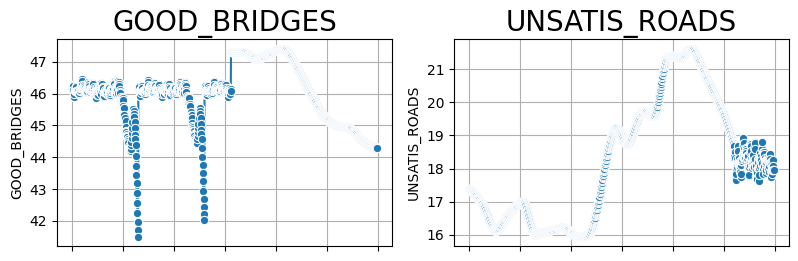

In [153]:
# Plot each variable in a mini-plot
fig, axes = plt.subplots(nrows=6, ncols=5, figsize=(20, 7*len(df_filled.columns)), sharex=True)

# Flatten the axes array for easy indexing
axes = axes.flatten()

for i, col in enumerate(df_filled.columns):
    sns.lineplot(data=df_filled, x=df_filled.index, y=col, ax=axes[i], marker='o')
    axes[i].set_title(f"{col}", fontsize=20)
    axes[i].set_ylabel(col)
    axes[i].grid(True)

# Hide any unused subplots (if num_vars is not a multiple of 5)
for i in range(len(df_filled.columns), len(axes)):
    fig.delaxes(axes[i])

plt.xlabel("DATE")
plt.tight_layout()
plt.show()

In [ ]:
# Verify that there are no missing values
df_filled.isna().values.any()

In [154]:
# Define the output file path
output_file = "/content/drive/My Drive/G720_CLIENT10_GAN.xlsx"

# Save DataFrame to Excel
df_filled.to_excel(output_file, index=False, engine='openpyxl')

print(f"Data successfully saved to {output_file}")

Data successfully saved to /content/drive/My Drive/G720_CLIENT10_GAN.xlsx


### CLIENT 11

In [155]:
# Load the file from Google Drive
file_path = '/content/drive/My Drive/G720_CLIENT11_Noisy_Interpolated.xlsx'

# Load specified sheet
df = pd.read_excel(file_path, engine='openpyxl')

# Display the first few rows
print(df.head())

   ACTIVE_SHOOTERS  BACKGROUND_CHECKS  FIREARM_PROD  DOM_VIOLENCE_RATE  \
0         0.000000       8.543037e+06  3.793541e+06                NaN   
1         0.190743       8.557898e+06  3.764666e+06                NaN   
2         0.378364       8.572529e+06  3.736068e+06                NaN   
3         0.562871       8.586926e+06  3.707759e+06                NaN   
4         0.744277       8.601084e+06  3.679751e+06                NaN   

   INCARCERATED_POP  HOMICIDE_RATE  DOM_TERROR_INCIDENTS  \
0        494.000000       5.900000                   NaN   
1        493.895079       5.943974                   NaN   
2        493.791918       5.987421                   NaN   
3        493.690613       6.030325                   NaN   
4        493.591261       6.072667                   NaN   

   DOM_TERROR_DEFENDANTS  FBI_INVESTIGATIONS  FBI_DISRUPTIONS  \
0                    NaN                 NaN              NaN   
1                    NaN                 NaN              NaN   

In [156]:
# Print how many missing values are still in the data
print(df.isnull().sum())

ACTIVE_SHOOTERS          260
BACKGROUND_CHECKS        104
FIREARM_PROD             208
DOM_VIOLENCE_RATE        728
INCARCERATED_POP         104
HOMICIDE_RATE             52
DOM_TERROR_INCIDENTS     624
DOM_TERROR_DEFENDANTS    676
FBI_INVESTIGATIONS       780
FBI_DISRUPTIONS          780
CRIM_JUSTICE_OPINION     156
CYBERATTACKS             988
CYBERATTACK_LOSSES       988
ANTIGOV_HATE_GROUPS        0
BLACK_POLICE_KILLINGS     52
BLACK_POLICE_INJURIES    416
dtype: int64


In [157]:
# Normalize data for GAN training using StandardScaler
scaler = StandardScaler()
data_scaled = scaler.fit_transform(df)

# Convert to 3D format (samples, timesteps, features)
def create_sequences(data, window_size):
    sequences = []
    for i in range(len(data) - window_size):
        sequences.append(data[i:i + window_size])
    return np.array(sequences)

window_size = 260  # 5 years of observations
train_data = create_sequences(data_scaled, window_size)

In [158]:
# Define the generator
def build_generator():
    model = Sequential([
        LSTM(100, return_sequences=True, activation='linear', input_shape=(1, noise_dim)),  # No built-in activation
        tf.keras.layers.LeakyReLU(alpha=0.2),  # Apply Leaky ReLU explicitly
        Dropout(0.2),

        LSTM(100, return_sequences=False, activation='linear'),  # No built-in activation
        tf.keras.layers.LeakyReLU(alpha=0.2),  # Apply Leaky ReLU explicitly

        Dense(df.shape[1] * window_size, activation='linear'),  # Keep final output linear
        tf.keras.layers.Reshape((window_size, df.shape[1]))  # Reshape to match expected shape
    ])
    return model

# Define the discriminator
def build_discriminator():
    model = Sequential([
        LSTM(100, return_sequences=True, activation='linear', input_shape=(window_size, df.shape[1])),
        tf.keras.layers.LeakyReLU(alpha=0.2),  # Apply Leaky ReLU explicitly
        Dropout(0.2),

        LSTM(50, return_sequences=False, activation='linear'),
        tf.keras.layers.LeakyReLU(alpha=0.2),  # Apply Leaky ReLU explicitly

        Dense(1, activation='linear')  # Output should remain linear
    ])
    return model

In [159]:
# Training Loop
epochs = 500
batch_size = 32
noise_dim = 50  # Noise dimension for the generator

# Initialize generator & discriminator
generator = build_generator()
discriminator = build_discriminator()

# Compile discriminator with clipnorm to prevent spiking in gradients
discriminator.compile(
    loss='mean_squared_error',
    optimizer=Adam(learning_rate=1e-4, beta_1=0.5, clipnorm=0.2),  # Use clipnorm for gradient clipping
    metrics=['mean_absolute_error']
)

# GAN Model (stack generator & discriminator)
gan_input = tf.keras.Input(shape=(noise_dim,))
reshaped_input = tf.keras.layers.Reshape((1, noise_dim))(gan_input)  # Reshape to (None, 1, noise_dim)
generated_data = generator(reshaped_input)  # Pass reshaped input through the generator
discriminator.trainable = False  # Freeze discriminator during GAN training
validity = discriminator(generated_data)
gan = tf.keras.Model(gan_input, validity)
# Compile GAN with gradient clipping
gan.compile(
    loss='mean_squared_error',
    optimizer=Adam(learning_rate=1e-4, beta_1=0.5, clipnorm=0.2)  # Use clipnorm for gradient clipping
)

# Helper function to get a batch of real data
def real_samples(batch_size):
    indices = np.random.randint(0, train_data.shape[0], batch_size)
    return train_data[indices]

# Helper function to generate fake data
def generate_fake_samples(batch_size):
    noise = np.random.normal(0, 1, (batch_size, noise_dim))  # Random noise
    noise = noise.reshape(batch_size, 1, noise_dim)  # Reshape to (batch_size, 1, noise_dim)
    fake_data = generator.predict(noise)  # Generate fake data from noise
    return fake_data

# Real labels (1 for real data) and fake labels (0 for fake data)
real_labels = np.ones((batch_size, 1))
fake_labels = np.zeros((batch_size, 1))

# Training loop
for epoch in range(epochs):
    # Train Discriminator
    real_data = real_samples(batch_size)  # Get real data
    fake_data = generate_fake_samples(batch_size)  # Get fake data generated by the GAN

    # Train the discriminator
    real_loss = discriminator.train_on_batch(real_data, real_labels)
    fake_loss = discriminator.train_on_batch(fake_data, fake_labels)

    # Extract the loss values from the tuples
    real_loss_value = real_loss[0]  # The first element is the loss
    fake_loss_value = fake_loss[0]  # The first element is the loss

    # Compute the discriminator loss as the average of real and fake losses
    d_loss = 0.5 * (real_loss_value + fake_loss_value)

    # Train Generator
    noise = np.random.normal(0, 1, (batch_size, noise_dim))  # Random noise for generator input
    g_loss = gan.train_on_batch(noise, real_labels)  # Generator tries to fool the discriminator

    # Print progress
    if epoch % 100 == 0:
        print(f"Epoch {epoch}: D Loss: {d_loss} | G Loss: {g_loss}")

/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
/usr/local/lib/python3.11/dist-packages/keras/src/layers/activations/leaky_relu.py:41: UserWarning: Argument `alpha` is deprecated. Use `negative_slope` instead.
  warnings.warn(


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 469ms/step


/usr/local/lib/python3.11/dist-packages/keras/src/backend/tensorflow/trainer.py:82: UserWarning: The model does not have any trainable weights.
  warnings.warn("The model does not have any trainable weights.")


Epoch 0: D Loss: nan | G Loss: 1.000048041343689
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
1

In [160]:
# Generate new time-series sequences
noise = np.random.normal(0, 1, (df.shape[0], 1, noise_dim))  # Reshape to (batch_size, 1, noise_dim)
synthetic_data = generator.predict(noise)

# Apply Gaussian smoothing to the generated data
sigma = 1  # Standard deviation for the Gaussian filter (adjust based on smoothing strength)
synthetic_data_smoothed = gaussian_filter(synthetic_data, sigma=sigma)

# Rescale back to original values
synthetic_data_rescaled = scaler.inverse_transform(synthetic_data_smoothed.reshape(-1, df.shape[1]))

# Replace missing values in original dataset
df_filled = df.copy()

# Fill in missing data
for i in range(len(df_filled)):
    for j in range(df.shape[1]):  # Loop over features
        if np.isnan(df_filled.iloc[i, j]):
            df_filled.iloc[i, j] = synthetic_data_rescaled[i, j]

38/38 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step


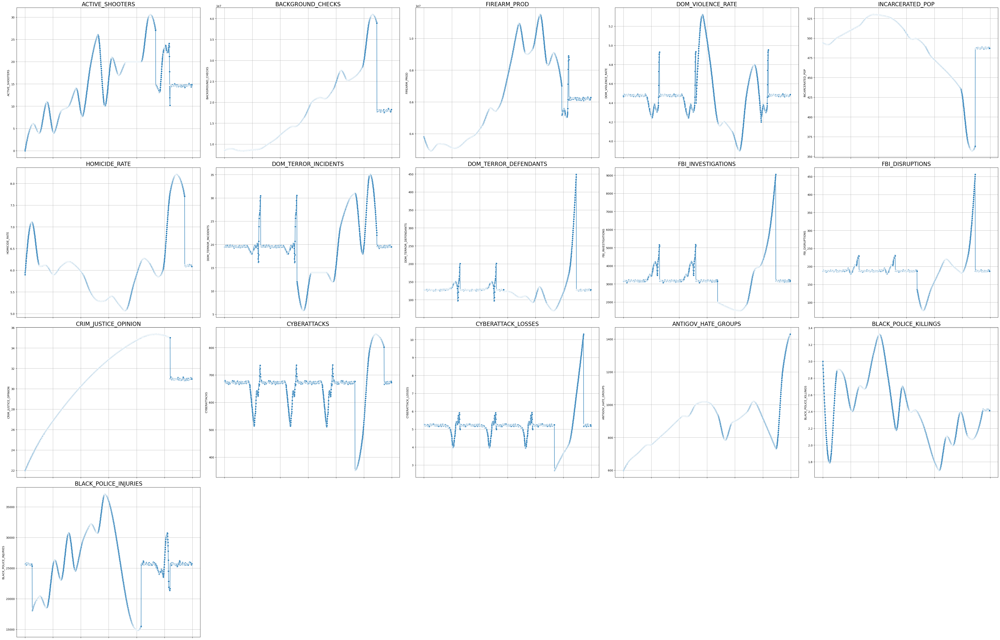

In [161]:
# Plot each variable in a mini-plot
fig, axes = plt.subplots(nrows=6, ncols=5, figsize=(50, 3*len(df_filled.columns)), sharex=True)

# Flatten the axes array for easy indexing
axes = axes.flatten()

for i, col in enumerate(df_filled.columns):
    sns.lineplot(data=df_filled, x=df_filled.index, y=col, ax=axes[i], marker='o')
    axes[i].set_title(f"{col}", fontsize=20)
    axes[i].set_ylabel(col)
    axes[i].grid(True)

# Hide any unused subplots (if num_vars is not a multiple of 5)
for i in range(len(df_filled.columns), len(axes)):
    fig.delaxes(axes[i])

plt.xlabel("DATE")
plt.tight_layout()
plt.show()

In [ ]:
# Verify that there are no missing values
df_filled.isna().values.any()

In [162]:
# Define the output file path
output_file = "/content/drive/My Drive/G720_CLIENT11_GAN.xlsx"

# Save DataFrame to Excel
df_filled.to_excel(output_file, index=False, engine='openpyxl')

print(f"Data successfully saved to {output_file}")

Data successfully saved to /content/drive/My Drive/G720_CLIENT11_GAN.xlsx


### CLIENT 12

In [163]:
# Load the file from Google Drive
file_path = '/content/drive/My Drive/G720_CLIENT12_Noisy_Interpolated.xlsx'

# Load specified sheet
df = pd.read_excel(file_path, engine='openpyxl')

# Display the first few rows
print(df.head())

   AGRI_SPENDING         FARMS  AGRI_SALES
0       2.080000  2.163740e+06  322.200000
1       2.065147  2.163096e+06  322.490353
2       2.050398  2.162458e+06  322.771126
3       2.035752  2.161826e+06  323.042470
4       2.021211  2.161201e+06  323.304534


In [164]:
# Print how many missing values are still in the data
print(df.isnull().sum())

AGRI_SPENDING    104
FARMS            260
AGRI_SALES         0
dtype: int64


In [165]:
# Normalize data for GAN training using StandardScaler
scaler = StandardScaler()
data_scaled = scaler.fit_transform(df)

# Convert to 3D format (samples, timesteps, features)
def create_sequences(data, window_size):
    sequences = []
    for i in range(len(data) - window_size):
        sequences.append(data[i:i + window_size])
    return np.array(sequences)

window_size = 260  # 5 years of observations
train_data = create_sequences(data_scaled, window_size)

In [166]:
# Define the generator
def build_generator():
    model = Sequential([
        LSTM(100, return_sequences=True, activation='linear', input_shape=(1, noise_dim)),  # No built-in activation
        tf.keras.layers.LeakyReLU(alpha=0.2),  # Apply Leaky ReLU explicitly
        Dropout(0.2),

        LSTM(100, return_sequences=False, activation='linear'),  # No built-in activation
        tf.keras.layers.LeakyReLU(alpha=0.2),  # Apply Leaky ReLU explicitly

        Dense(df.shape[1] * window_size, activation='linear'),  # Keep final output linear
        tf.keras.layers.Reshape((window_size, df.shape[1]))  # Reshape to match expected shape
    ])
    return model

# Define the discriminator
def build_discriminator():
    model = Sequential([
        LSTM(100, return_sequences=True, activation='linear', input_shape=(window_size, df.shape[1])),
        tf.keras.layers.LeakyReLU(alpha=0.2),  # Apply Leaky ReLU explicitly
        Dropout(0.2),

        LSTM(50, return_sequences=False, activation='linear'),
        tf.keras.layers.LeakyReLU(alpha=0.2),  # Apply Leaky ReLU explicitly

        Dense(1, activation='linear')  # Output should remain linear
    ])
    return model

In [167]:
# Training Loop
epochs = 500
batch_size = 32
noise_dim = 50  # Noise dimension for the generator

# Initialize generator & discriminator
generator = build_generator()
discriminator = build_discriminator()

# Compile discriminator with clipnorm to prevent spiking in gradients
discriminator.compile(
    loss='mean_squared_error',
    optimizer=Adam(learning_rate=1e-4, beta_1=0.5, clipnorm=0.2),  # Use clipnorm for gradient clipping
    metrics=['mean_absolute_error']
)

# GAN Model (stack generator & discriminator)
gan_input = tf.keras.Input(shape=(noise_dim,))
reshaped_input = tf.keras.layers.Reshape((1, noise_dim))(gan_input)  # Reshape to (None, 1, noise_dim)
generated_data = generator(reshaped_input)  # Pass reshaped input through the generator
discriminator.trainable = False  # Freeze discriminator during GAN training
validity = discriminator(generated_data)
gan = tf.keras.Model(gan_input, validity)
# Compile GAN with gradient clipping
gan.compile(
    loss='mean_squared_error',
    optimizer=Adam(learning_rate=1e-4, beta_1=0.5, clipnorm=0.2)  # Use clipnorm for gradient clipping
)

# Helper function to get a batch of real data
def real_samples(batch_size):
    indices = np.random.randint(0, train_data.shape[0], batch_size)
    return train_data[indices]

# Helper function to generate fake data
def generate_fake_samples(batch_size):
    noise = np.random.normal(0, 1, (batch_size, noise_dim))  # Random noise
    noise = noise.reshape(batch_size, 1, noise_dim)  # Reshape to (batch_size, 1, noise_dim)
    fake_data = generator.predict(noise)  # Generate fake data from noise
    return fake_data

# Real labels (1 for real data) and fake labels (0 for fake data)
real_labels = np.ones((batch_size, 1))
fake_labels = np.zeros((batch_size, 1))

# Training loop
for epoch in range(epochs):
    # Train Discriminator
    real_data = real_samples(batch_size)  # Get real data
    fake_data = generate_fake_samples(batch_size)  # Get fake data generated by the GAN

    # Train the discriminator
    real_loss = discriminator.train_on_batch(real_data, real_labels)
    fake_loss = discriminator.train_on_batch(fake_data, fake_labels)

    # Extract the loss values from the tuples
    real_loss_value = real_loss[0]  # The first element is the loss
    fake_loss_value = fake_loss[0]  # The first element is the loss

    # Compute the discriminator loss as the average of real and fake losses
    d_loss = 0.5 * (real_loss_value + fake_loss_value)

    # Train Generator
    noise = np.random.normal(0, 1, (batch_size, noise_dim))  # Random noise for generator input
    g_loss = gan.train_on_batch(noise, real_labels)  # Generator tries to fool the discriminator

    # Print progress
    if epoch % 100 == 0:
        print(f"Epoch {epoch}: D Loss: {d_loss} | G Loss: {g_loss}")

/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
/usr/local/lib/python3.11/dist-packages/keras/src/layers/activations/leaky_relu.py:41: UserWarning: Argument `alpha` is deprecated. Use `negative_slope` instead.
  warnings.warn(


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 339ms/step


/usr/local/lib/python3.11/dist-packages/keras/src/backend/tensorflow/trainer.py:82: UserWarning: The model does not have any trainable weights.
  warnings.warn("The model does not have any trainable weights.")


Epoch 0: D Loss: nan | G Loss: 1.0000853538513184
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step


In [168]:
# Generate new time-series sequences
noise = np.random.normal(0, 1, (df.shape[0], 1, noise_dim))  # Reshape to (batch_size, 1, noise_dim)
synthetic_data = generator.predict(noise)

# Apply Gaussian smoothing to the generated data
sigma = 1  # Standard deviation for the Gaussian filter (adjust based on smoothing strength)
synthetic_data_smoothed = gaussian_filter(synthetic_data, sigma=sigma)

# Rescale back to original values
synthetic_data_rescaled = scaler.inverse_transform(synthetic_data_smoothed.reshape(-1, df.shape[1]))

# Replace missing values in original dataset
df_filled = df.copy()

# Fill in missing data
for i in range(len(df_filled)):
    for j in range(df.shape[1]):  # Loop over features
        if np.isnan(df_filled.iloc[i, j]):
            df_filled.iloc[i, j] = synthetic_data_rescaled[i, j]

36/36 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step


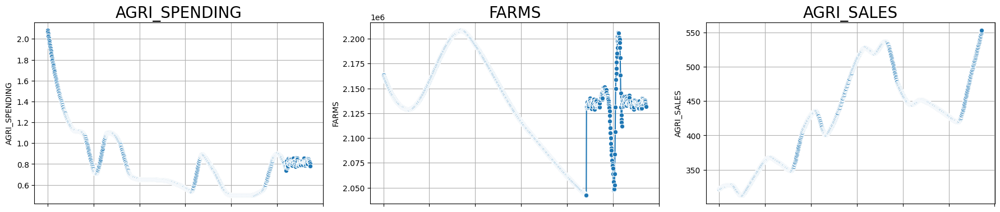

In [170]:
# Plot each variable in a mini-plot
fig, axes = plt.subplots(nrows=6, ncols=5, figsize=(30, 7*len(df_filled.columns)), sharex=True)

# Flatten the axes array for easy indexing
axes = axes.flatten()

for i, col in enumerate(df_filled.columns):
    sns.lineplot(data=df_filled, x=df_filled.index, y=col, ax=axes[i], marker='o')
    axes[i].set_title(f"{col}", fontsize=20)
    axes[i].set_ylabel(col)
    axes[i].grid(True)

# Hide any unused subplots (if num_vars is not a multiple of 5)
for i in range(len(df_filled.columns), len(axes)):
    fig.delaxes(axes[i])

plt.xlabel("DATE")
plt.tight_layout()
plt.show()

In [ ]:
# Verify that there are no missing values
df_filled.isna().values.any()

In [171]:
# Define the output file path
output_file = "/content/drive/My Drive/G720_CLIENT12_GAN.xlsx"

# Save DataFrame to Excel
df_filled.to_excel(output_file, index=False, engine='openpyxl')

print(f"Data successfully saved to {output_file}")

Data successfully saved to /content/drive/My Drive/G720_CLIENT12_GAN.xlsx


In [172]:
# End of code 3/1/25
# Edited 3/5/25 for noisy interpolated data instead of Akima interpolated, unsuccessful attempt